In [1]:
from astropy.io import fits
from astropy.wcs import WCS
from glob import glob
import numpy as np

from scipy.optimize import minimize 
%matplotlib notebook
import matplotlib.pyplot as plt
from copy import deepcopy
from astropy.modeling import models, fitting
from astropy.stats import sigma_clipped_stats
import sys
sys.path.append('../src/scenes/')
from correct_saturation import saturated_stars, _get_bsc, SkyCoord,mask_rad_func

import warnings
# nuke warnings because sigma clip is extremely annoying 
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=RuntimeWarning) 
warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning)

In [ ]:
bands = ['r','i','z','y']
files = glob(f'data/ps1_skycell/*unconv.fits')
files = [f.split('.stk')[0] + '.stk.' for f in files]
files = list(set(files))
for file in files:
    for band in bands:
        f = file + band + '.unconv.fits'
        mask = f.split('.fits')[0] + '.mask.fits'
        try:
            thing = saturated_stars(f,mask_file=mask,savepath='data/ps1_skycell/',overwrite=False,run=True,)
            print('Done: ',f)
        except:
            print('Error: ',f)

Done:  data/ps1_skycell/rings.v3.skycell.2246.013.stk.r.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2246.013.stk.i.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2246.013.stk.z.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2246.013.stk.y.unconv.fits
Done:  data/ps1_skycell/rings.v3.skycell.2247.067.stk.r.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2247.067.stk.i.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2247.067.stk.z.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2247.067.stk.y.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2246.053.stk.r.unconv.fits
Done:  data/ps1_skycell/rings.v3.skycell.2246.053.stk.i.unconv.fits
Done:  data/ps1_skycell/rings.v3.skycell.2246.053.stk.z.unconv.fits
Done:  data/ps1_skycell/rings.v3.skycell.2246.053.stk.y.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2246.041.stk.r.unconv.fits
File exists
Done:  d

Done:  data/ps1_skycell/rings.v3.skycell.2246.000.stk.i.unconv.fits
Done:  data/ps1_skycell/rings.v3.skycell.2246.000.stk.z.unconv.fits
Done:  data/ps1_skycell/rings.v3.skycell.2246.000.stk.y.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2246.063.stk.r.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2246.063.stk.i.unconv.fits
Done:  data/ps1_skycell/rings.v3.skycell.2246.063.stk.z.unconv.fits
Done:  data/ps1_skycell/rings.v3.skycell.2246.063.stk.y.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2246.031.stk.r.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2246.031.stk.i.unconv.fits
Done:  data/ps1_skycell/rings.v3.skycell.2246.031.stk.z.unconv.fits
Done:  data/ps1_skycell/rings.v3.skycell.2246.031.stk.y.unconv.fits
Done:  data/ps1_skycell/rings.v3.skycell.2247.018.stk.r.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.2247.018.stk.i.unconv.fits
File exists
Done:  data/ps1_skycell/rings.v3.skycell.224

In [2]:
fnum = 1
band = 'y'
files = glob(f'data/ps1_skycell/*.{band}.*unconv.fits')
#files = glob(f'data/star_field/*.{band}.*unconv.fits')

mask = files[fnum].split('.fits')[0] + '.mask.fits'

In [3]:
thing = saturated_stars(files[0],mask_file=mask,savepath='data/star_field/',overwrite=True,run=True)

this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


KeyboardInterrupt: 

In [17]:
from photutils.aperture import CircularAperture
from photutils.aperture import ApertureStats, aperture_photometry

In [18]:
cat = thing.ps1cat

In [19]:
pos = list(zip(cat.x.values, cat.y.values))
aperture = CircularAperture(pos, 20)
m,med,std = sigma_clipped_stats(thing.data)
origphot = aperture_photometry(thing.data-med, aperture)
repphot = aperture_photometry(thing.replaced-med, aperture)
repmag = -2.5*np.log10(repphot['aperture_sum'].value)
origmag = -2.5*np.log10(origphot['aperture_sum'].value)

/var/folders/db/hdghk6ts5g11hr10jq0ss625nf1ny2/T/ipykernel_70451/4167454166.py:6: RuntimeWarning: invalid value encountered in log10
  repmag = -2.5*np.log10(repphot['aperture_sum'].value)
/var/folders/db/hdghk6ts5g11hr10jq0ss625nf1ny2/T/ipykernel_70451/4167454166.py:7: RuntimeWarning: invalid value encountered in log10
  origmag = -2.5*np.log10(origphot['aperture_sum'].value)


In [20]:
mag = cat.rMeanPSFMag.values

<IPython.core.display.Javascript object>


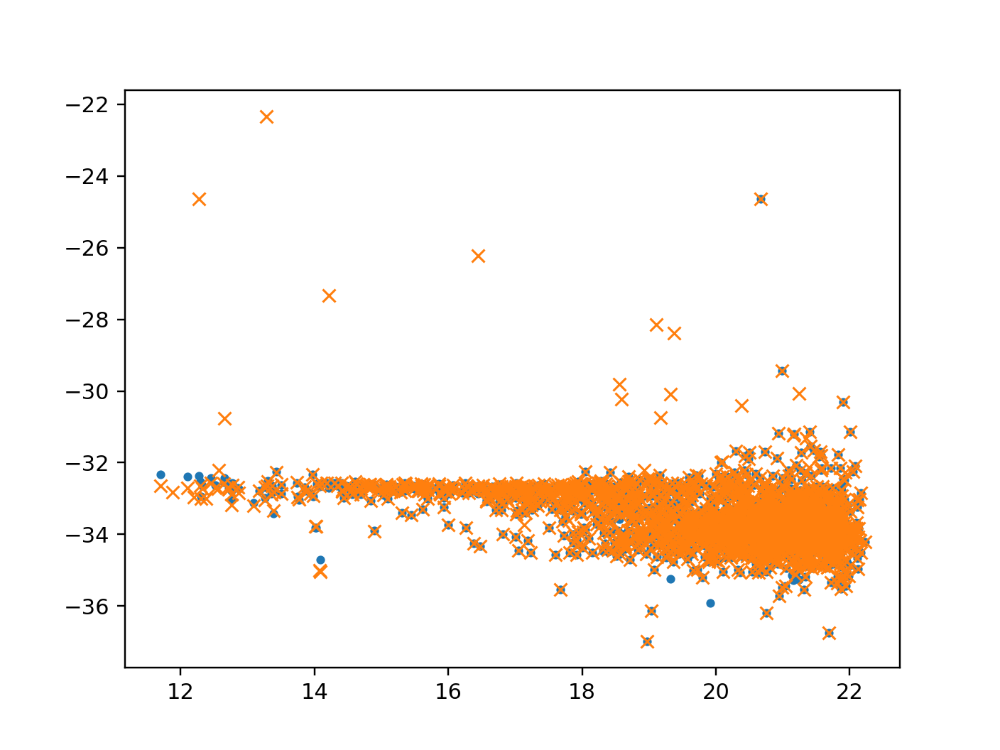

In [21]:
plt.figure()
plt.plot(mag,origmag-mag,'.')
plt.plot(mag,repmag-mag,'x')


In [5]:
(21/0.25)  * 5

420.0

<IPython.core.display.Javascript object>


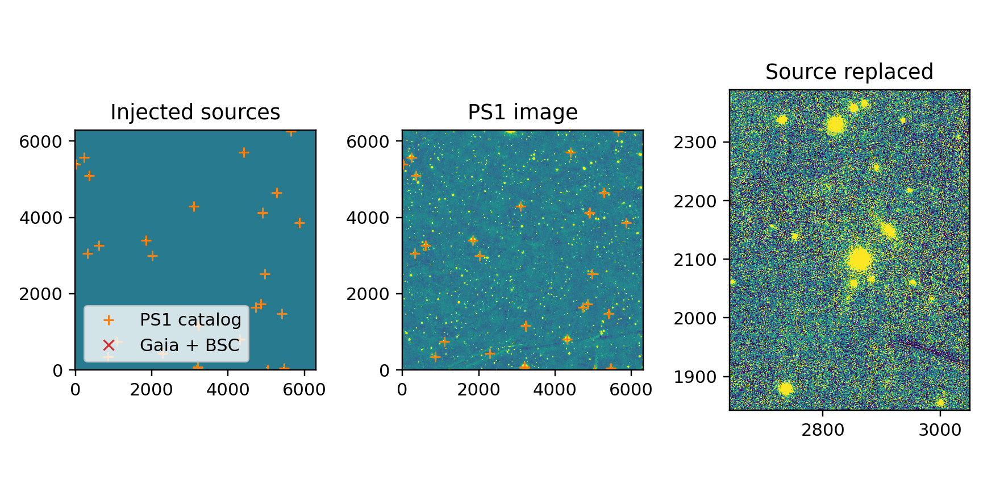

In [9]:
thing.plot_result()

<IPython.core.display.Javascript object>


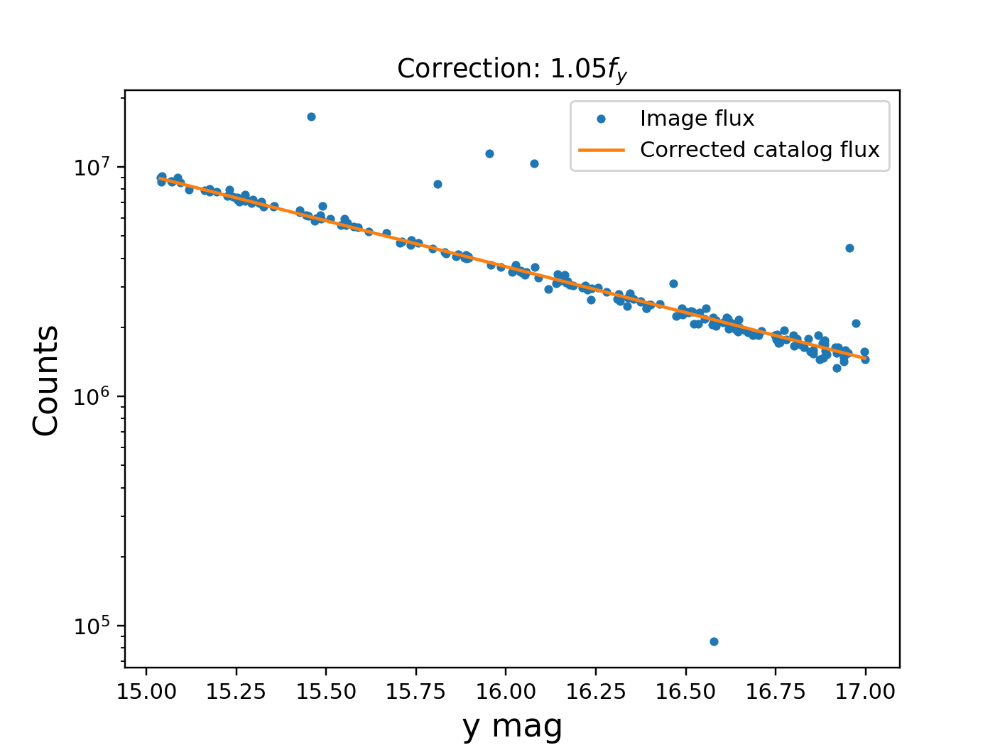

In [4]:
thing.plot_flux_correction()

<IPython.core.display.Javascript object>


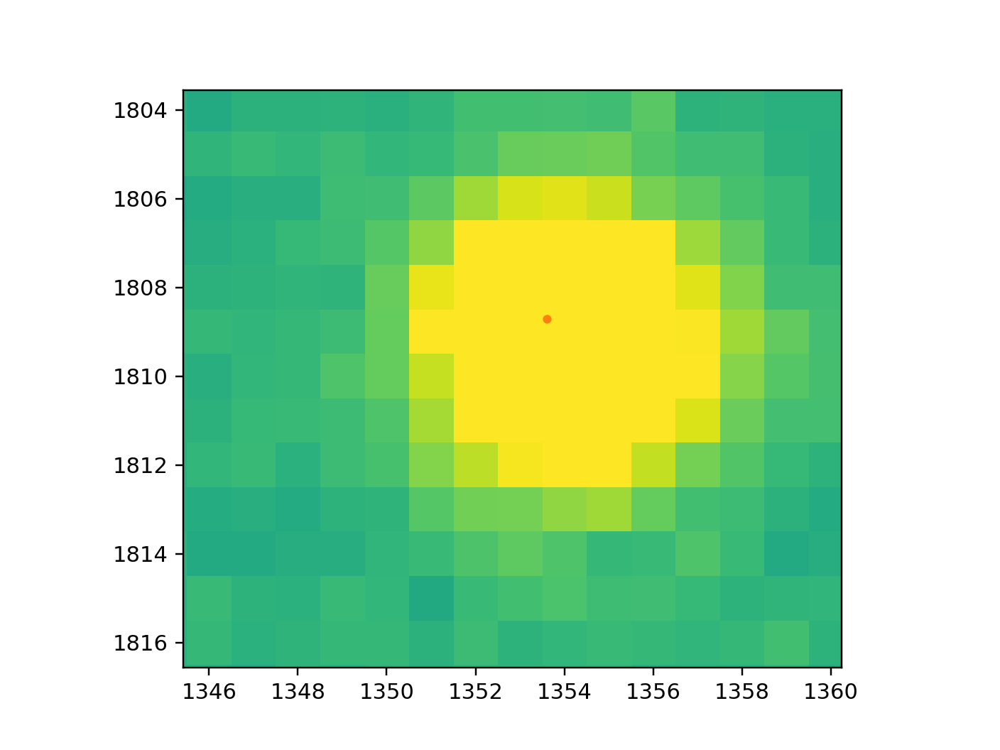

In [14]:
sub = thing.ps1cat.loc[(thing.ps1cat.rMeanPSFMag >= 18.9) & (thing.ps1cat.rMeanPSFMag <= 19.2)]
plt.figure()
plt.imshow(thing.data,vmax=2e3)
plt.plot(sub.x.values,sub.y.values,'C1.')

In [12]:
mask_rad_func(19)

array(31)

In [4]:
files = glob(f'data/star_field/*.030.*unconv.fits')

In [5]:
files

['data/star_field/rings.v3.skycell.2246.030.stk.r.unconv.fits',
 'data/star_field/rings.v3.skycell.2246.030.stk.z.unconv.fits',
 'data/star_field/rings.v3.skycell.2246.030.stk.i.unconv.fits',
 'data/star_field/rings.v3.skycell.2246.030.stk.y.unconv.fits']

In [2]:
import warnings
# nuke warnings because sigma clip is extremely annoying 
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=RuntimeWarning) 
warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning)

In [3]:
bands = ['r','i','z','y']
files = glob(f'data/ps1_skycell/*unconv.fits')
files = [f.split('stk')]

In [4]:
files

['data/ps1_skycell/rings.v3.skycell.2247.049.stk.y.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2247.007.stk.y.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2246.043.stk.y.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2246.044.stk.i.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2180.097.stk.i.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2247.028.stk.i.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2246.022.stk.i.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2247.027.stk.r.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2246.063.stk.r.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2247.069.stk.r.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2247.029.stk.z.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2246.031.stk.r.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2246.023.stk.z.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2247.067.stk.z.unconv.fits',
 'data/ps1_skycell/rings.v3.skycell.2246.011.stk.y.unconv.fits',
 'data/ps1_skycell/rings.

In [5]:
bands = ['r','i','z','y']
files = glob(f'data/ps1_skycell/*unconv.fits')
for file in files:
    #for band in bands:
    mask = file.split('.fits')[0] + '.mask.fits'
    thing = saturated_stars(file,mask_file=mask,savepath='data/ps1_skycell/',overwrite=False,run=True)
    print('Done: ',file)

this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


AttributeError: 'saturated_stars' object has no attribute '_check_exist'

<IPython.core.display.Javascript object>


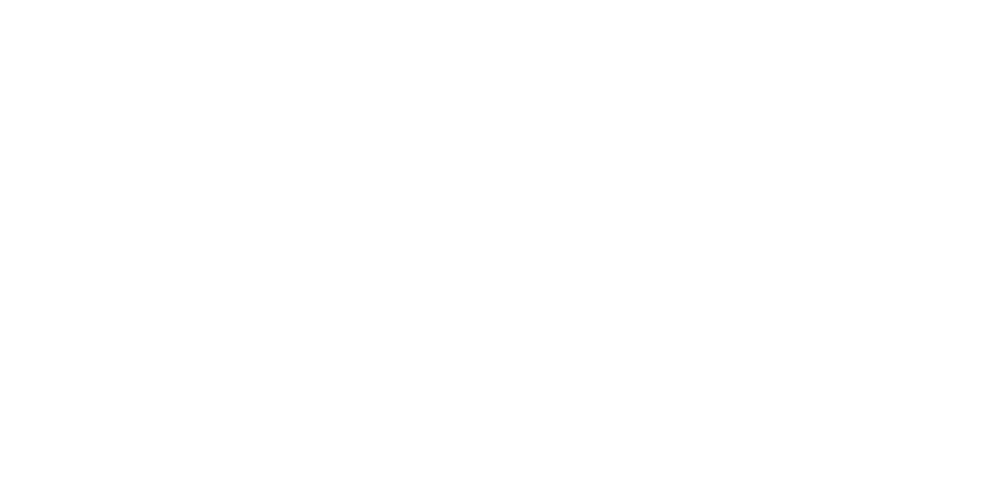

In [5]:
thing.plot_result()

In [133]:
data = thing.data
x = thing.calcat.x.values; y = thing.calcat.y.values
size = 41
hsize = (size - 1) / 2
mask = ((x > hsize) & (x < (data.shape[1] -1 - hsize)) &
        (y > hsize) & (y < (data.shape[0] -1 - hsize)))  

In [134]:
from astropy.table import Table
stars_tbl = Table()
stars_tbl['x'] = x[mask]#.astype(int) 
stars_tbl['y'] = y[mask]#.astype(int) 
stars_tbl['mag'] = thing.calcat[thing.band+'MeanPSFMag'][mask]#.astype(int) 

In [135]:
from astropy.stats import sigma_clipped_stats
mean_val, median_val, std_val = sigma_clipped_stats(thing.masking, sigma=2.0)  
data -= median_val  

In [152]:
def plot_flux_correction(self):
    plt.figure()
    plt.semilogy(self.calcat[self.band+'MeanPSFMag'],self._fitflux,label='PSF flux')
    plt.plot(self.calcat[self.band+'MeanPSFMag'],10**((self.calcat[self.band+'MeanPSFMag'].values-self.zp)/-2.5)*self.flux_factor,label='Corrected catalog flux')
    plt.xlabel(self.band+' mag',fontsize=15)
    plt.ylabel('Counts',fontsize=15)
    plt.legend()
    plt.title('Correction: ' + str(np.round(self.flux_factor,2))+rf'$f_{self.band}$')

<IPython.core.display.Javascript object>


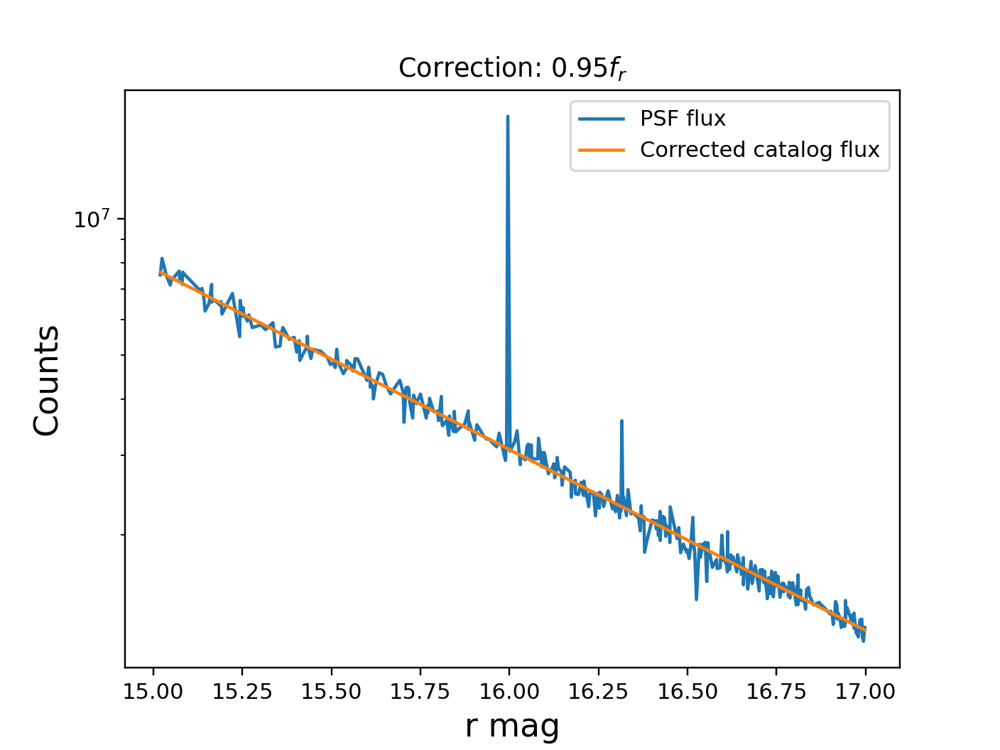

In [153]:
plot_flux_correction(thing)

In [26]:
def plot_result(self):
    vmin=np.nanpercentile(self.replaced,16)
    vmax=np.nanpercentile(self.replaced,90)
    plt.figure(figsize=(8,4))
    plt.subplot(132)
    plt.title('PS1 image')
    plt.imshow(self.data,vmax=vmax,vmin=vmin)
    plt.plot(self.ps1satcat['x'].values,self.ps1satcat['y'].values,'C1+')
    if self.kill_cat is not None:
        plt.plot(self.kill_cat['x'].values,self.kill_cat['y'].values,'C3x')
    plt.subplot(131)
    plt.title('Injected sources')
    plt.imshow(self.inject,vmax=vmax,vmin=vmin)
    plt.plot(self.ps1satcat['x'].values,self.ps1satcat['y'].values,'C1+',label='PS1 catalog')
    if self.kill_cat is not None:
        plt.plot(self.kill_cat['x'].values,self.kill_cat['y'].values,'C3x',label='Gaia + BSC')
    plt.legend()
    plt.subplot(133)
    plt.title('Source replaced')
    plt.imshow(self.replaced,vmax=vmax,vmin=vmin)
    plt.plot(self.ps1satcat['x'].values,self.ps1satcat['y'].values,'C1+',label='PS1 catalog')
    if self.kill_cat is not None:
        plt.plot(self.kill_cat['x'].values,self.kill_cat['y'].values,'C3x',label='Gaia + BSC')
    ax = plt.gca()
    #plt.legend()
    plt.tight_layout()

In [6]:
plot_result(thing)

NameError: name 'plot_result' is not defined

In [13]:

test = deepcopy(thing.kill_cat)

In [67]:
x = thing.kill_cat.x.values; y = thing.kill_cat.y.values
dist = np.sqrt((x[:,np.newaxis] - x[np.newaxis,:])**2 + (y[:,np.newaxis] - y[np.newaxis,:])**2)
far = dist > 100
f = 10**((test.mag.values-25)/-2.5)
f = np.array([f,f])
fn = np.nansum(f,axis=1)
mn = -2.5*np.log10(fn) + 25

In [68]:
mn

array([2.42622433, 2.42622433])

In [62]:
f = 10**((test.mag.values-25)/-2.5)
f

array([1.19720025e+08, 9.50591661e+08])

In [63]:
np.array([f,f])

array([[1.19720025e+08, 9.50591661e+08],
       [1.19720025e+08, 9.50591661e+08]])

In [35]:
f[:,close[1]]

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [10]:
d = fits.open('test/rings.v3.skycell.2247.027.stk.r.unconv.satcor.fits')[0].data

<IPython.core.display.Javascript object>


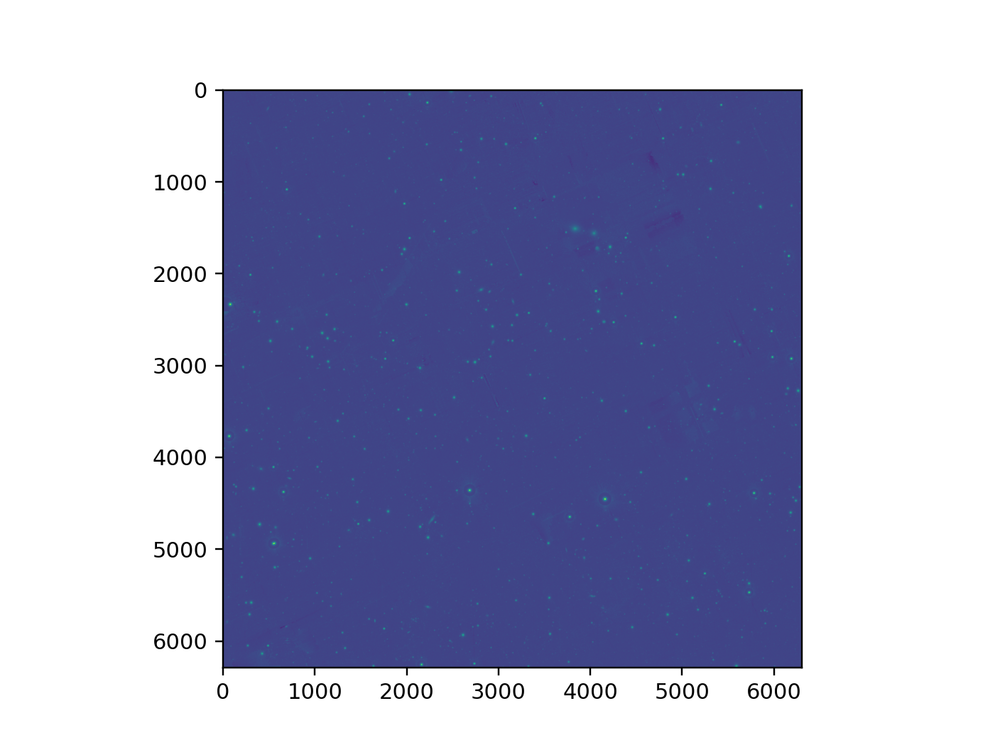

In [11]:
plt.figure()
plt.imshow(d)

In [2]:
import pandas as pd

def isolate_stars(cat,only_stars=False,Qf_lim=0.85,psfkron_diff=0.05):
    qf_ind = ((cat.gQfPerfect.values > Qf_lim) & (cat.rQfPerfect.values > Qf_lim) & 
              (cat.iQfPerfect.values > Qf_lim) & (cat.zQfPerfect.values > Qf_lim))
    kron_ind = (cat.rMeanPSFMag.values - cat.rMeanKronMag.values) < psfkron_diff
    ind = qf_ind & kron_ind
    if only_stars:
        cat = cat.iloc[ind]
        cat.loc[:,'star'] = 1
    else:
        cat.loc[:,'star'] = 0
        cat.loc[ind,'star'] = 1
    return cat 

def cut_bad_detections(cat):
    ind = (cat.rMeanPSFMag.values > 0) & (cat.iMeanPSFMag.values > 0) & (cat.zMeanPSFMag.values > 0)
    return cat.iloc[ind]


def query_ps1(ra,dec,radius,only_stars=False,version='dr2'):
    if (version.lower() != 'dr2') & (version.lower() != 'dr1'):
        m = 'Version must be dr2, or dr1'
        raise ValueError(m)
    
    str = f'https://catalogs.mast.stsci.edu/api/v0.1/panstarrs/{version.lower()}/mean?ra={ra}&dec={dec}&radius={radius}&nDetections.gte=5&pagesize=-1&format=csv'
    try:
        cat = pd.read_csv(str)
    except pd.errors.EmptyDataError:
        print('No detections')
        cat = []
    cat = isolate_stars(cat,only_stars=only_stars)
    cat = cut_bad_detections(cat)
    return cat 


In [860]:
mask = fits.open(files[fnum].split('.fits')[0] + '.mask.fits')[0].data

<IPython.core.display.Javascript object>


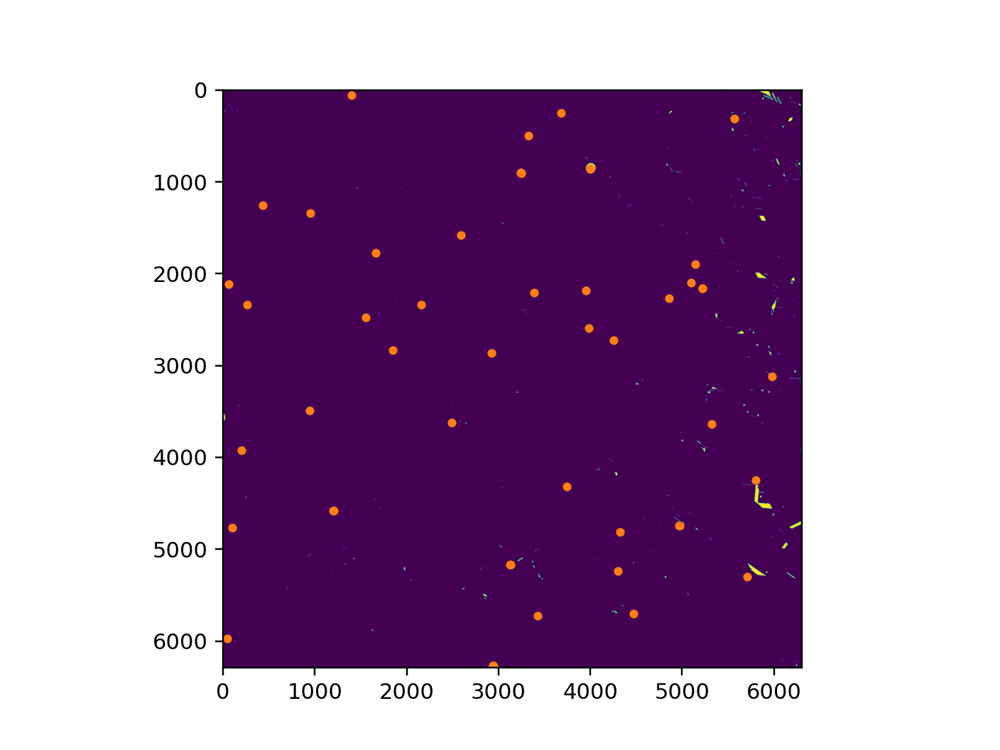

In [886]:
plt.figure()
plt.imshow(mask>0)
plt.plot(sat['x'].values,sat['y'].values,'C1.')

In [ ]:
4096 # around saturation
0x0200 # spike


In [ ]:
mask_file = glob(f'data/ps1_skycell2/*2247.027.stk.{band}*mask*')

In [5]:
fnum = 1
wcs = WCS(fits.open(files[fnum])[0].header)
hdu = fits.open(files[fnum])
ra,dec = wcs.all_pix2world(hdu[0].data.shape[1]/2,hdu[0].data.shape[0]/2,1)
data = fits.open(files[fnum])[0].data

zp = 25 + 2.5*np.log10(hdu[0].header['EXPTIME'])

v = data
a = 2.5/np.log(10)
x = v/a
flux = hdu[0].header['boffset'] + hdu[0].header['bsoften'] * 2 * np.sinh(x)
m, med, std = sigma_clipped_stats(flux)

this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


KeyError: "Keyword 'BOFFSET' not found."

<IPython.core.display.Javascript object>


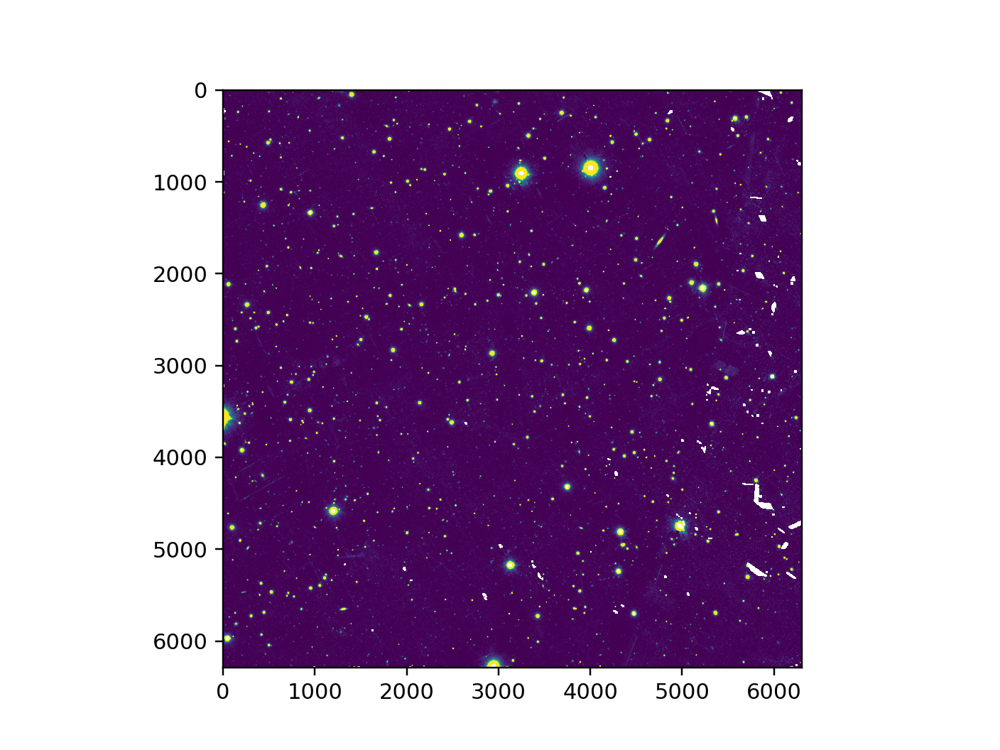

In [824]:
plt.figure()
plt.imshow(flux,vmin=0,vmax=1e3)

In [825]:
tab = query_ps1(ra,dec,0.4)
x,y = wcs.all_world2pix(tab.raMean.values,tab.decMean.values,0)
tab['x'] = x; tab['y'] = y
ind = (x > 5) & (x < data.shape[1]-5) & (y > 5) & (y < data.shape[0]-5)
tab = tab.iloc[ind]
tab = tab.loc[(tab['iMeanPSFMag'] > 0) & (tab['rMeanPSFMag'] > 0) & 
              (tab['zMeanPSFMag'] > 0) & (tab['yMeanPSFMag'] > 0)]
tab = tab.sort_values(band+'MeanPSFMag')


In [826]:
ind = data[tab['y'].values.astype(int),tab['x'].values.astype(int)]
sind = np.where(np.isnan(ind))
sat = deepcopy(tab.loc[tab[band+'MeanPSFMag'] < 14])
#normal = deepcopy(tab.iloc[np.where(np.isfinite(ind))])
#normal = normal.sort_values('rMeanPSFMag')

<IPython.core.display.Javascript object>


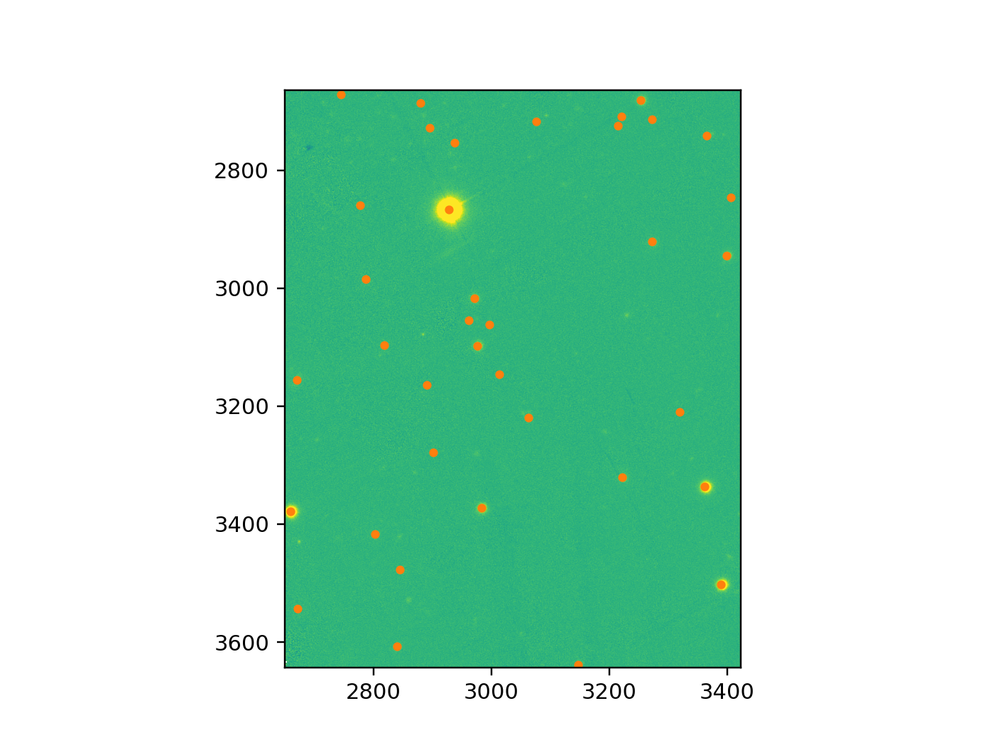

In [827]:
plt.figure()
plt.imshow(flux,vmax=2e3)
plt.plot(tab['x'].values,tab['y'].values,'C1.')

In [828]:
def PS_PSF(params,x,y):
    sdx,sdy,sdxy,k = params
    z = x**2/(2*sdx**2) + y**2/(2*sdy**2) + sdxy*x*y
    #psf = (1 + k*z + z*2.25)**(-1)
    psf = (1 + z + z**2/2 + z**3/6)**(-1) # PGAUSS
    psf /= np.nansum(psf)
    return psf

def psf_minimizer(x0,cut,x,y):
    c = deepcopy(cut)
    #y, x = np.mgrid[:c.shape[0], :c.shape[1]]
    #x = x - c.shape[1] / 2 #+ x0[-2]
    #y = y - c.shape[0] / 2 #+ x0[-1]
    x = x - x0[-2]
    y = y - x0[-1]
    psf = PS_PSF(x0[:-2],x,y)
    c /= np.nansum(c)
    res = np.nansum((c-psf)**2)
    return res


def PSF_phot(f,cut,psf):
    res = np.nansum((cut-psf*f)**2)
    return res

In [829]:
cal = tab.loc[(tab[band+'MeanPSFMag'] > 15) & (tab[band+'MeanPSFMag'] < 16)]
psf_mod = []
for j in range(len(cal)):
    xx = cal['x'].values[j]; yy = cal['y'].values[j]
    #cut = flux[int(yy)-10:int(yy)+11,int(xx)-10:int(xx)+11]
    s = 15
    yint = int(yy+0.5)
    xint = int(xx+0.5)
    cut = deepcopy(flux[yint-s:yint+s+1,xint-s:xint+s+1])
    y, x = np.mgrid[:cut.shape[0], :cut.shape[1]]
    x = x - cut.shape[1] / 2 - (xx-xint)
    y = y - cut.shape[0] / 2 - (yy-yint)
    x0 = [10,10,0,1,0,0]
    res = minimize(psf_minimizer,x0,args=(cut,x,y))#,method='Powell')
    psf_mod += [res.x]
psf_mod = np.array(psf_mod)

<IPython.core.display.Javascript object>


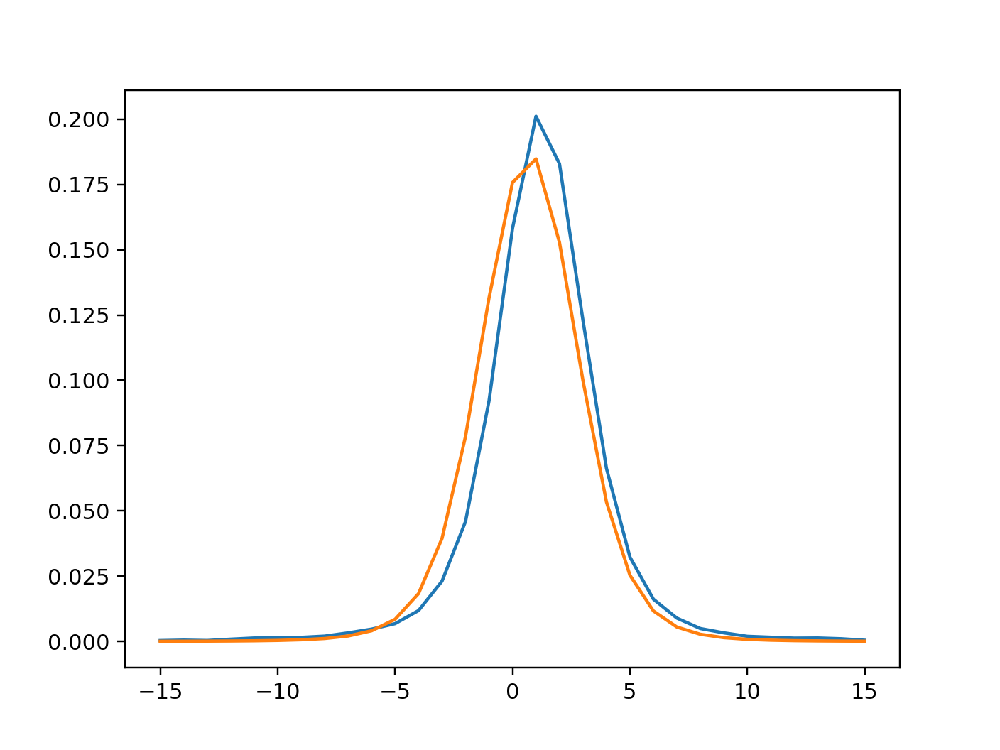

In [830]:
psf = PS_PSF(res.x[:-2],x,y)
plt.figure()
plt.plot(np.arange(-15,16),cut[:,15]/np.nansum(cut[:,15]))
plt.plot(np.arange(-15,16),psf[:,15]/np.nansum(psf[:,15]))

In [831]:
psf_param = np.nanmedian(psf_mod,axis=0)
psf = PS_PSF(psf_param[:-2],x,y)

In [898]:
cal = tab.loc[(tab[band+'MeanPSFMag'] > 15) & (tab[band+'MeanPSFMag'] < 17)]
fit_flux = []
psf_mod = []
for j in range(len(cal)):
    xx = cal['x'].values[j]; yy = cal['y'].values[j]
    #cut = flux[int(yy)-10:int(yy)+11,int(xx)-10:int(xx)+11]
    s = 15
    yint = int(yy+0.5)
    xint = int(xx+0.5)
    cut = deepcopy(flux[yint-s:yint+s+1,xint-s:xint+s+1])
    y, x = np.mgrid[:cut.shape[0], :cut.shape[1]]
    x = x - cut.shape[1] / 2 - (xx-xint)
    y = y - cut.shape[0] / 2 - (yy-yint)
    x0 = [10,10,0,1,0,0]
    #res = minimize(psf_minimizer,x0,args=(cut,x,y))#,method='Powell')
    psf = PS_PSF(psf_param[:-2],x-psf_param[-2],y-psf_param[-1])
    cflux = 10**((cal[band+'MeanPSFMag'].values[j]-zp)/-2.5)
    f = minimize(PSF_phot,cflux,args=(cut,psf))
    fit_flux += [f.x]
fit_flux = np.array(fit_flux)

<IPython.core.display.Javascript object>


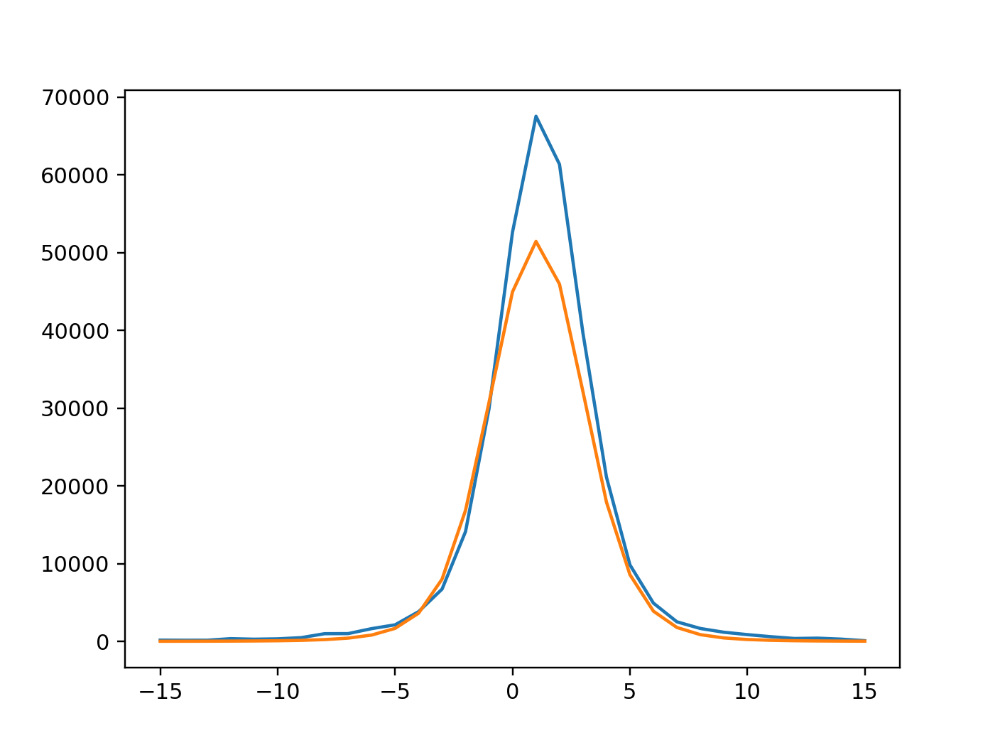

In [899]:
cat_flux = 10**((cal[band+'MeanPSFMag'].values-(25+2.5*np.log10(hdu[0].header['EXPTIME'])))/-2.5)*factor
plt.figure()
plt.plot(np.arange(-15,16),cut[:,15])
plt.plot(np.arange(-15,16),(psf*cat_flux[j]*factor)[:,15]+med)

<IPython.core.display.Javascript object>


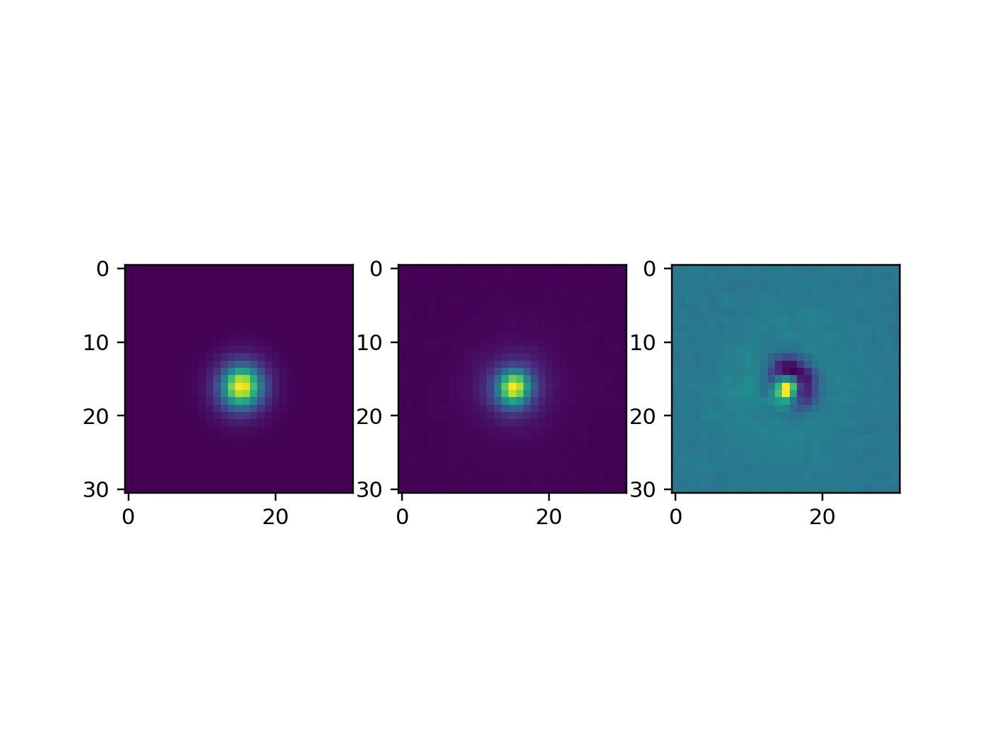

In [900]:
plt.figure()
plt.subplot(131)
plt.imshow(psf*fit_flux[j])
plt.subplot(132)
plt.imshow(cut)
plt.subplot(133)
plt.imshow(cut-(psf*fit_flux[j]))

In [901]:
factor = np.nanmedian(fit_flux / 10**((cal[band+'MeanPSFMag'].values-(25+2.5*np.log10(hdu[0].header['EXPTIME'])))/-2.5))

<IPython.core.display.Javascript object>


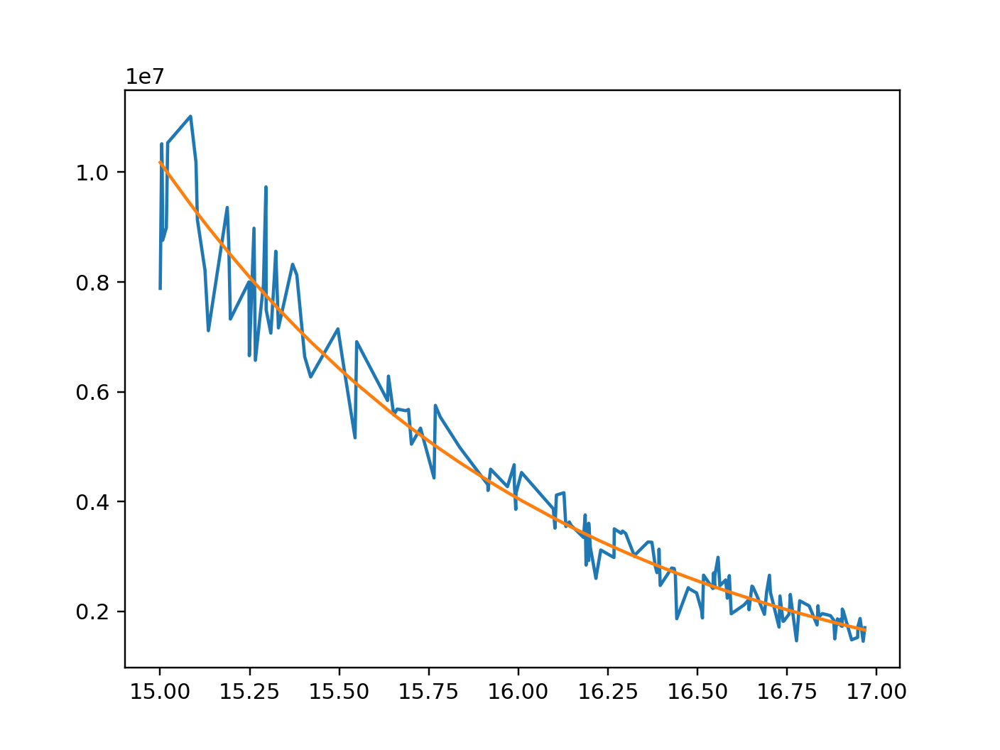

In [902]:
plt.figure()
plt.plot(cal[band+'MeanPSFMag'],fit_flux)
plt.plot(cal[band+'MeanPSFMag'],10**((cal[band+'MeanPSFMag'].values-(25+2.5*np.log10(hdu[0].header['EXPTIME'])))/-2.5)*factor)

In [903]:
factor

0.9088801876144221

In [838]:
cal = tab.loc[(tab[band+'MeanPSFMag'] > 13)]
fit_flux = []
j = 8
xx = cal['x'].values[j]; yy = cal['y'].values[j]
#cut = flux[int(yy)-10:int(yy)+11,int(xx)-10:int(xx)+11]
s = 60
yint = int(yy+0.5)
xint = int(xx+0.5)
cut = deepcopy(flux[yint-s:yint+s+1,xint-s:xint+s+1])
y, x = np.mgrid[:cut.shape[0], :cut.shape[1]]
x = x - cut.shape[1] / 2 - (xx-xint)
y = y - cut.shape[0] / 2 - (yy-yint)
x0 = [10,10,0,1,0,0]
#res = minimize(psf_minimizer,x0,args=(cut,x,y))#,method='Powell')
#psf = PS_PSF(res.x[:-2],x-res.x[-2],y-res.x[-1])
psf = PS_PSF(psf_param[:-2],x-psf_param[-2],y-psf_param[-1])

cflux = 10**((cal[band+'MeanPSFMag'].values[j]-zp)/-2.5)
f = minimize(PSF_phot,cflux,args=(cut,psf))
fit_flux += [f.x]

<IPython.core.display.Javascript object>


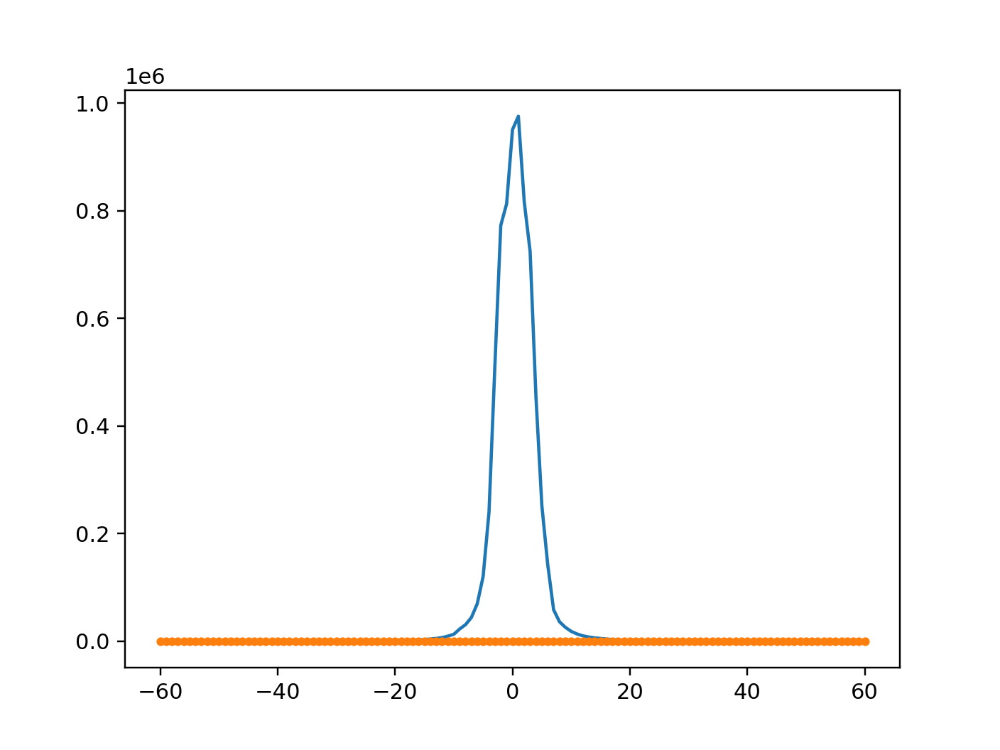

In [839]:
plt.figure()
plt.plot(np.arange(-60,61),cut[:,60])
plt.plot(np.arange(-60,61),(psf*cat_flux[j]*factor)[:,60]+med,'.')

<IPython.core.display.Javascript object>


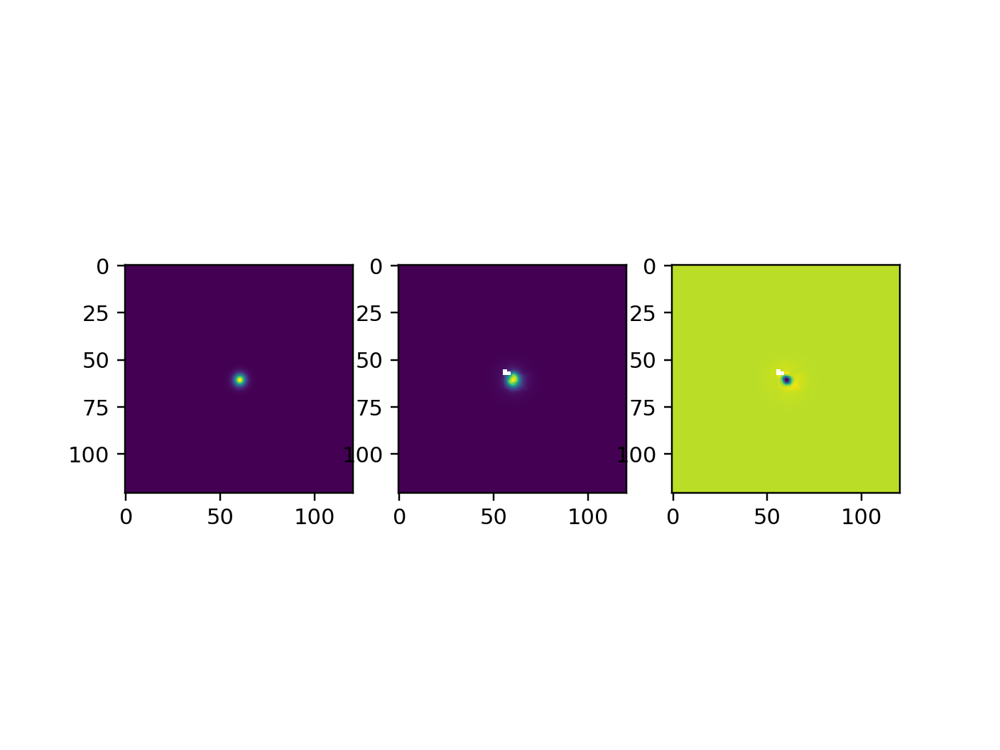

In [840]:
plt.figure()
plt.subplot(131)
plt.imshow(psf/np.nansum(psf))
plt.subplot(132)
plt.imshow(cut/np.nansum(cut))
plt.subplot(133)
plt.imshow(cut/np.nansum(cut) - psf/np.nansum(psf))

In [841]:
rad = 20
py,px = np.mgrid[:rad*2,:rad*2]
psf = PS_PSF(psf_param[:-2],px-psf_param[-2]-rad,py-psf_param[-1]-rad)
y,x = np.mgrid[:flux.shape[0],:flux.shape[1]]
masking = deepcopy(flux)
inject = np.zeros_like(flux)
for i in range(1):#len(sat)):
    i=-1#+=20
    xx = sat['x'].values[i]; yy = sat['y'].values[i]
    dist = np.sqrt(((x-xx))**2 + ((y-yy))**2)
    
    ind = np.where(dist < rad)
    masking[ind] = np.nan
    
    dx = min(ind[1])
    dy = min(ind[0])
    cflux = 10**((sat[band+'MeanPSFMag'].values[i]-zp)/-2.5)
    inject[ind] += psf[ind[0]-dy,ind[1]-dx] * cflux*factor

In [842]:
rad

20

In [894]:
def mask_rad_func(x, a=7.47132813e+03, b=5.14848986e-01, c=3.15022393e+01):
    rad = np.array(a * np.exp(-b * x) + c)
    rad[rad>300] = 300
    rad = rad.astype(int)
    return rad


In [895]:
masking = deepcopy(flux)
inject = np.zeros_like(flux)
rads = mask_rad_func(sat[band+'MeanPSFMag'].values,*popt)
cfluxes = 10**((sat[band+'MeanPSFMag'].values-zp)/-2.5)
start = time.time()
for i in range(len(sat)):
    rad = rads[i]
    cflux = cfluxes[i]
    
    y,x = np.mgrid[:rad*2,:rad*2]
    psf = PS_PSF(psf_param[:-2],x-psf_param[-2]-rad,y-psf_param[-1]-rad)
    tpsf = time.time()
    #y,x = np.mgrid[:flux.shape[0],:flux.shape[1]]
    
    xx = sat['x'].values[i]; yy = sat['y'].values[i]
    dist = np.sqrt(((x-rad))**2 + ((y-rad))**2)
    tdist = time.time()
    ind = np.array(np.where(dist < rad))
    ind[0] += int(yy) - rad
    ind[1] += int(xx) - rad
    good = (ind[0] >= 0) & (ind[1] >= 0) & (ind[0] < flux.shape[0]) & (ind[1] < flux.shape[1])
    ind = ind[:,good]
    masking[ind[0],ind[1]] = np.nan
    tmask = time.time()
    dx = min(ind[1])
    dy = min(ind[0])
    
    inject[ind[0],ind[1]] += psf[ind[0]-dy,ind[1]-dx] * cflux*factor + med

In [896]:
masking[mask>0] = med

In [906]:
newheader = deepcopy(hdu[0].header)

In [907]:
newheader['SATCOR'] = (True,'Corrected sat stars')

In [908]:
newheader

SIMPLE  =                    T / Uncompressed file's conforms to FITS           
BITPIX  =                   16 / data type of original image                    
NAXIS   =                    2 / dimension of original image                    
NAXIS1  =                 6307 / length of original image axis                  
NAXIS2  =                 6289 / length of original image axis                  
CTYPE1  = 'RA---TAN'                                                            
CTYPE2  = 'DEC--TAN'                                                            
CRVAL1  =     118.124999999996                                                  
CRVAL2  =     45.9999999999984                                                  
CRPIX1  =               17719.                                                  
CRPIX2  =               -5567.                                                  
CDELT1  = 6.94444461259988E-05                                                  
CDELT2  = 6.94444461259988E-

In [909]:
import datetime

In [912]:
today = datetime.date.today()
print(today)

2024-08-12


In [917]:
datetime.date.today().isoformat()

'2024-08-12'

In [916]:
a.isoformat()

'2024-08-12'

<IPython.core.display.Javascript object>


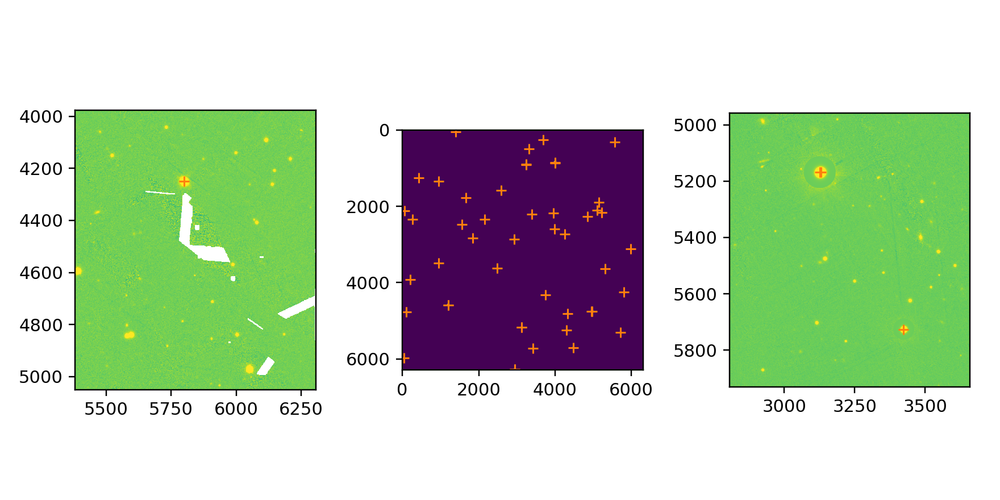

In [897]:
plt.figure(figsize=(8,4))
plt.subplot(131)
plt.imshow(flux,vmax=1e3)
plt.plot(sat['x'].values,sat['y'].values,'C1+')
plt.subplot(132)
plt.imshow(inject,vmax=1e3)
plt.plot(sat['x'].values,sat['y'].values,'C1+')
plt.subplot(133)
plt.imshow(np.nansum([masking,inject],axis=0),vmax=1e3)
plt.plot(sat['x'].values,sat['y'].values,'C1+')
plt.tight_layout()

In [779]:
bad = sat.iloc[-14]#[band+'MeanPSFMag']

In [782]:
bad[band+'MeanPSFMag'] - bad['yMeanKronMag']

1.084000587463379

In [793]:
bad.raMean

121.0710979

In [794]:
bad.decMean

45.85127437

In [696]:
ind.shape

(2, 76413)

In [692]:
psf.shape

(312, 312)

In [690]:
thing = np.array(ind)
thing.shape

(2, 77401)

<IPython.core.display.Javascript object>


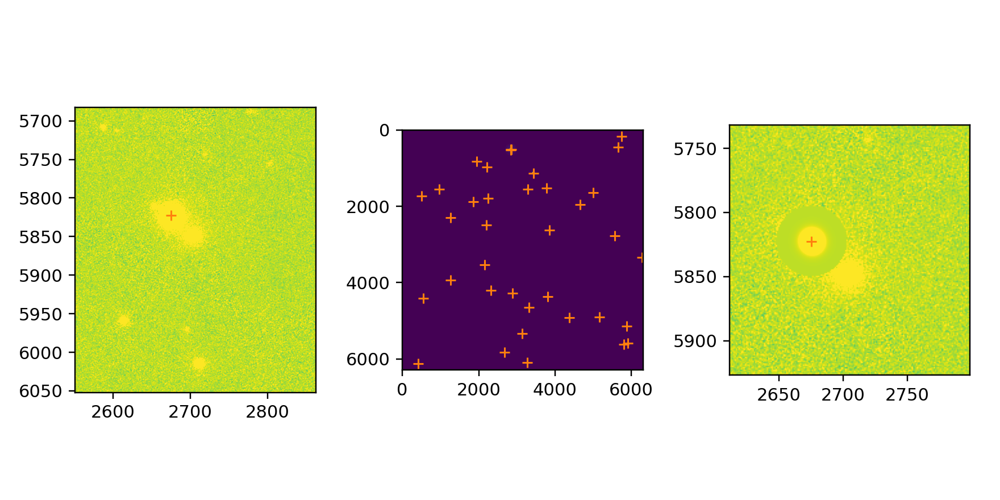

In [673]:
plt.figure(figsize=(8,4))
plt.subplot(131)
plt.imshow(flux,vmax=1e3)
plt.plot(sat['x'].values,sat['y'].values,'C1+')
plt.subplot(132)
plt.imshow(inject,vmax=1e3)
plt.plot(sat['x'].values,sat['y'].values,'C1+')
plt.subplot(133)
plt.imshow(np.nansum([masking,inject],axis=0),vmax=1e3)
plt.plot(sat['x'].values,sat['y'].values,'C1+')
plt.tight_layout()

In [594]:
sat['iMeanPSFMag']

10337     6.9800
6552      9.2460
4147     10.3443
4450     10.7690
7064     10.7880
4148     10.9720
4076     11.1230
7047     11.6210
5580     11.6730
9230     11.9230
2764     12.0010
1314     12.0380
9853     12.3660
7707     12.3940
3160     12.5360
4322     12.6490
9572     12.6920
6317     12.7980
5765     12.8400
518      12.8520
9284     13.0010
8623     13.0620
5643     13.0810
6471     13.0850
4449     13.1140
3085     13.2040
2394     13.2740
4313     13.3210
6064     13.3420
10339    13.3701
8503     13.3760
3079     13.4350
731      13.6091
5713     13.6634
691      13.7558
8040     13.8176
3696     13.8186
9327     13.8271
3374     13.9217
7606     13.9443
9078     13.9483
866      13.9560
2176     13.9660
5042     13.9704
4208     13.9860
Name: iMeanPSFMag, dtype: float64

<IPython.core.display.Javascript object>


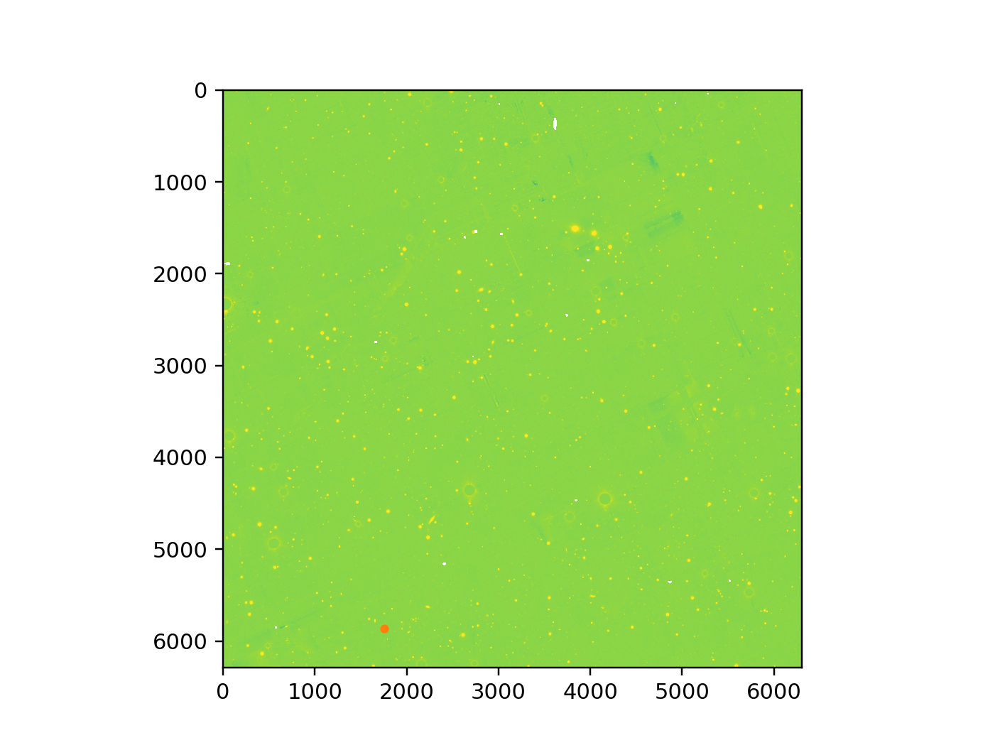

In [526]:
plt.figure()
plt.imshow(masking,vmax=1e3)
plt.plot(xx,yy,'C1.')
#plt.plot(sat['x'].values,sat['y'].values,'C3+')

In [496]:
sat.rMeanPSFMag.values[i]

13.987299919128418

In [ ]:
rad = mag * -10.68 + 166

In [507]:
fitted_line

<Linear1D(slope=-10.68563894, intercept=166.03340292)>

In [14]:
def mask_rad_func(x, a=4.95930915e+03, b=4.69695559e-01, c=1.47032902e+01):
    return a * np.exp(-b * x) + c

In [22]:
popt

array([ 1.32489992e+03,  2.47932366e-01, -1.91237835e+01])

/var/folders/db/hdghk6ts5g11hr10jq0ss625nf1ny2/T/ipykernel_15856/1271327024.py:6: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * x) + c


<IPython.core.display.Javascript object>


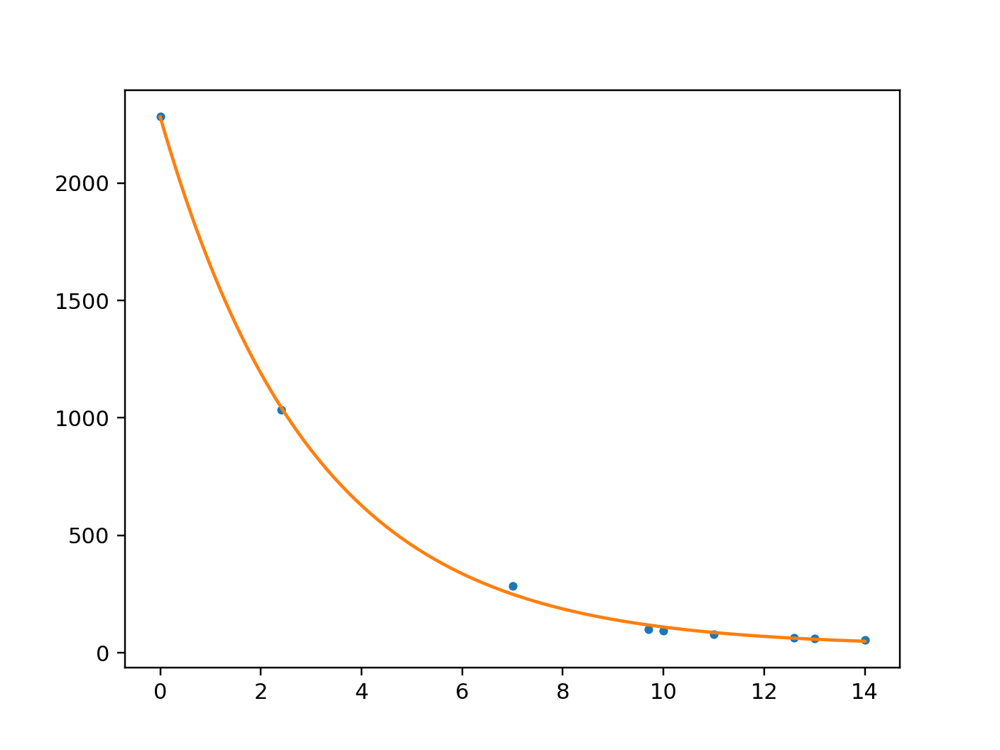

In [6]:
m = np.array([0,2.4,7,9.7,10,11,12.6,13,14])
r = np.array([1350+500+400,1000,220+30,65,60,45,30,25,20])+15+20
from scipy.optimize import curve_fit

def mask_rad_func(x, a, b, c):
    return a * np.exp(-b * x) + c

popt, pcov = curve_fit(mask_rad_func, m, r)

xi = np.arange(0,14.1,.1)
plt.figure()
plt.plot(m,r,'.')
#plt.plot(xi,fitted_line(xi))
#plt.plot(xi,fitted_line(xi))
plt.plot(xi,mask_rad_func(xi,*popt))

In [7]:
popt

array([2.25512307e+03, 3.30876377e-01, 2.70001850e+01])

<IPython.core.display.Javascript object>


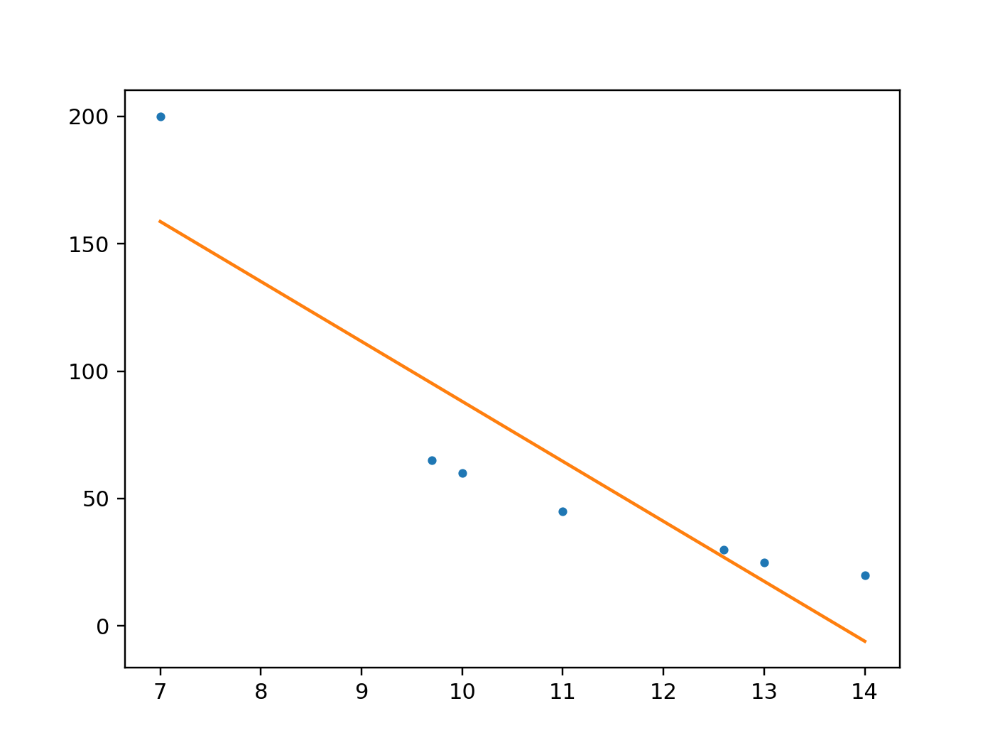

In [602]:
m = [7,9.7,10,11,12.6,13,14]
r = [200,65,60,45,30,25,20]
from astropy.modeling import models, fitting
fit = fitting.LinearLSQFitter()
# initialize a linear model
line_init = models.Linear1D()
# fit the data with the fitter
fitted_line = fit(line_init, m,r)
xi = np.arange(7,14.1,.1)
plt.figure()
plt.plot(m,r,'.')
plt.plot(xi,fitted_line(xi))

In [503]:
80-25

55

<IPython.core.display.Javascript object>


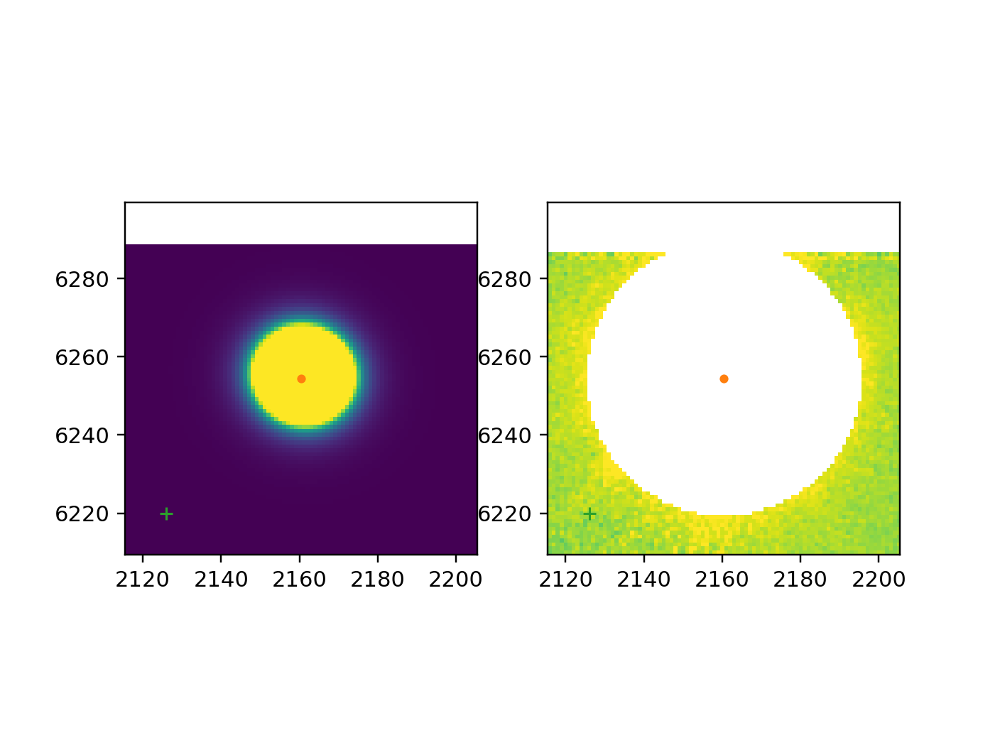

(6209.374446091575, 6299.374446091575)

In [444]:
plt.figure()
plt.subplot(121)
plt.imshow(inject,vmax=1e3)
plt.plot(xx,yy,'C1.')
plt.plot(dx,dy,'C2+')
plt.xlim(xx-(rad+10),xx+rad+10)
plt.ylim(yy-(rad+10),yy+rad+10)

plt.subplot(122)
plt.imshow(masking,vmax=1e3)
plt.plot(xx,yy,'C1.')
plt.plot(dx,dy,'C2+')
plt.xlim(xx-(rad+10),xx+rad+10)
plt.ylim(yy-(rad+10),yy+rad+10)

<IPython.core.display.Javascript object>


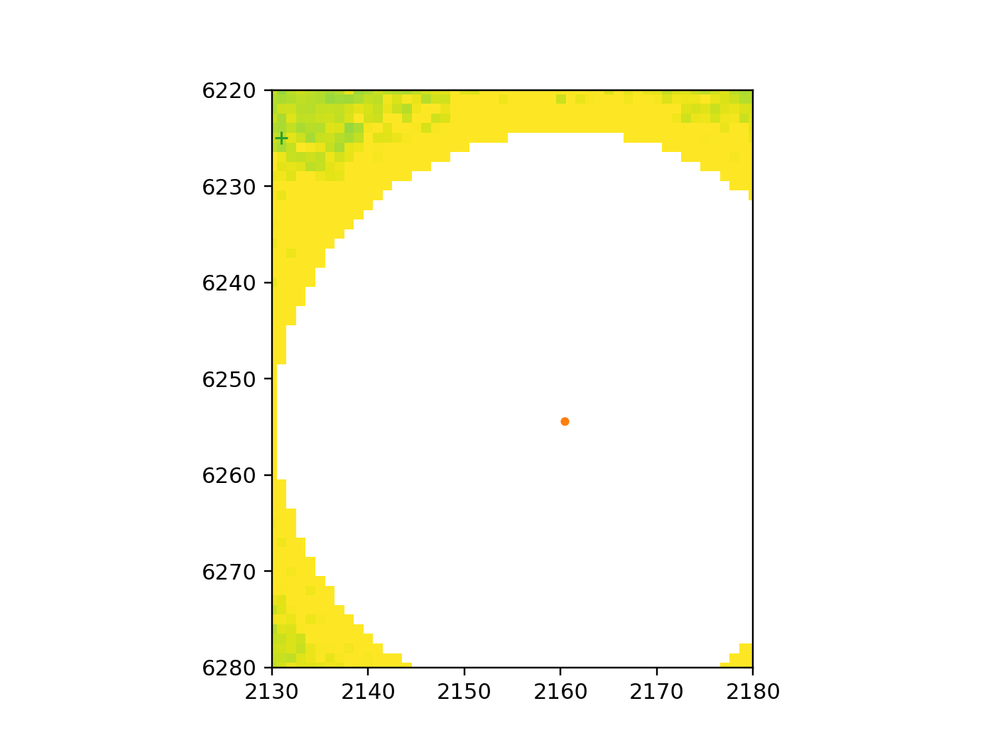

(6280.0, 6220.0)

In [438]:
plt.figure()
plt.imshow(masking,vmax=1e3)
plt.plot(xx,yy,'C1.')
plt.plot(dx,dy,'C2+')
plt.xlim(2130,2180)
plt.ylim(6280,6220)

In [327]:
test

array([False, False, False, ..., False, False, False])

<IPython.core.display.Javascript object>


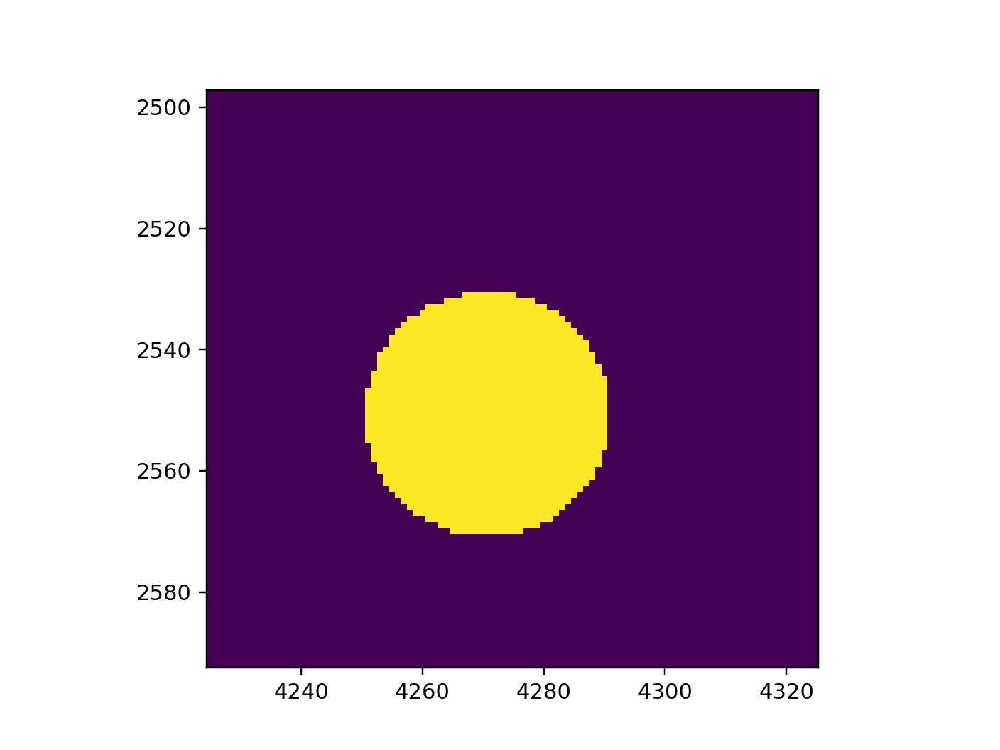

In [324]:
plt.figure()
plt.imshow(test)

<IPython.core.display.Javascript object>


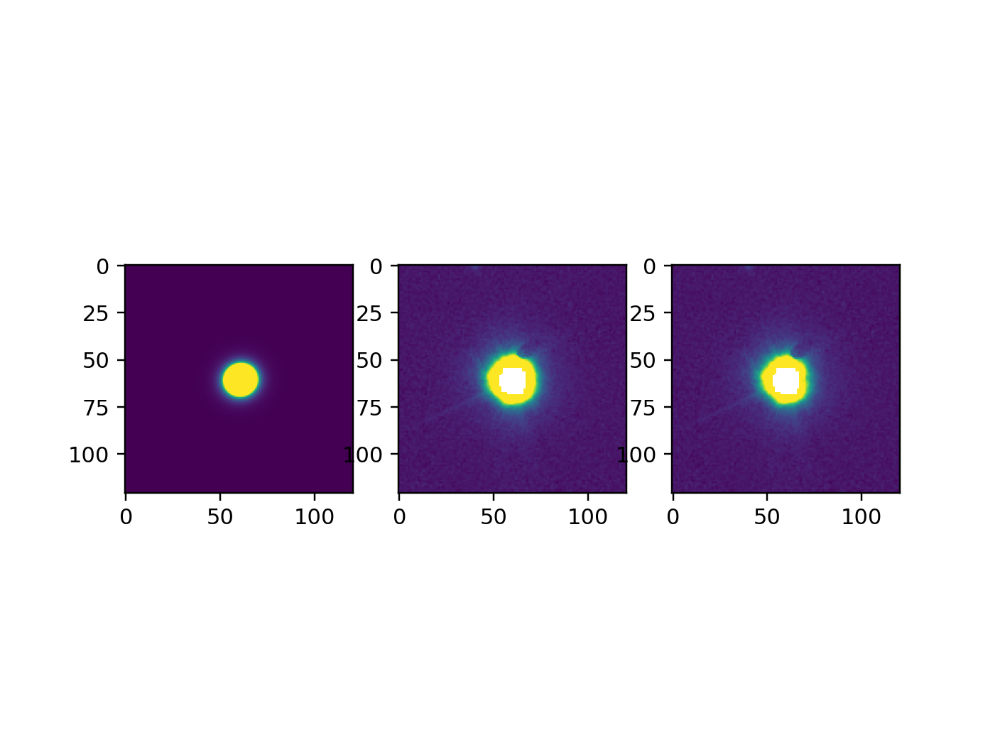

In [277]:
plt.figure()
plt.subplot(131)
plt.imshow(psf*cat_flux[j]*factor,vmax=1e4)
plt.subplot(132)
plt.imshow(cut,vmax=1e4)
plt.subplot(133)
plt.imshow(cut-psf*cat_flux[j]*factor,vmax=1e4)

In [278]:
cut.shape

(121, 121)

<IPython.core.display.Javascript object>


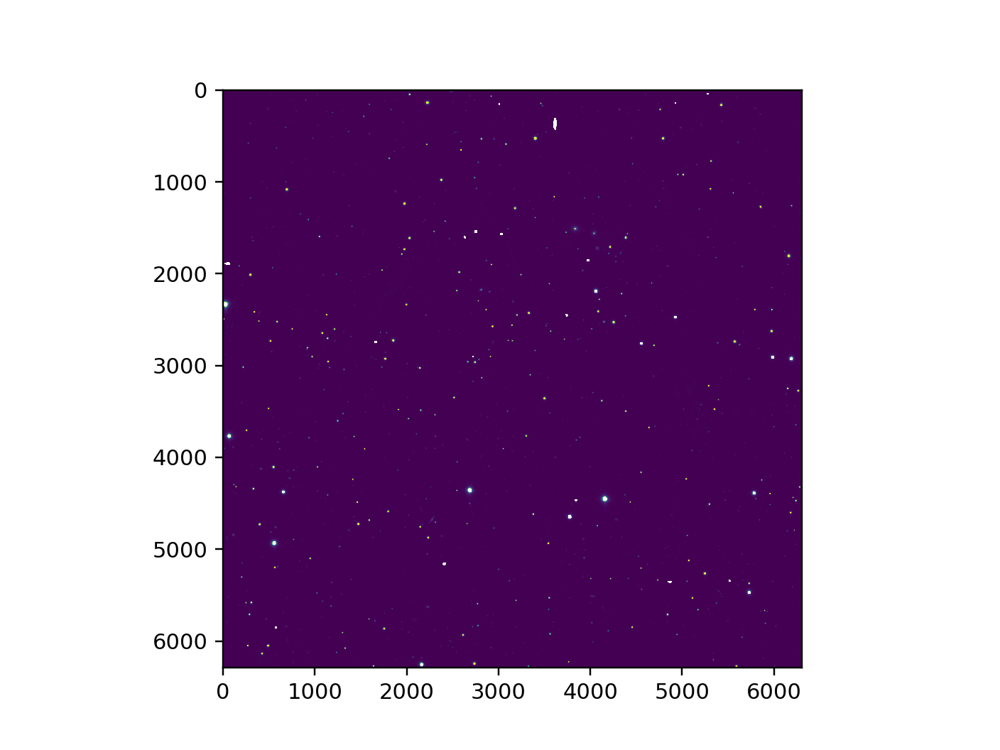

In [181]:
plt.figure()
plt.imshow(flux,vmax=2e4,vmin=-1)

In [911]:
10**((normal.rMeanPSFMag.values[j]-(25+2.5*np.log10(hdu[0].header['EXPTIME'])))/-2.5)

64388729.185531214

In [ ]:
2.5*np.log10(hdu[0].header['EXPTIME']) -2.5*np.log10(fits.open('data/ps1_skycell/ps1grid.fits'))

In [901]:
normal.rMeanPSFMag.values[j]

13.246000289916992

In [902]:
f.x - cflux

array([-54460638.69383584])

In [903]:
psf = PS_PSF(res.x[:-2],x-res.x[-2],y-res.x[-1])

<IPython.core.display.Javascript object>


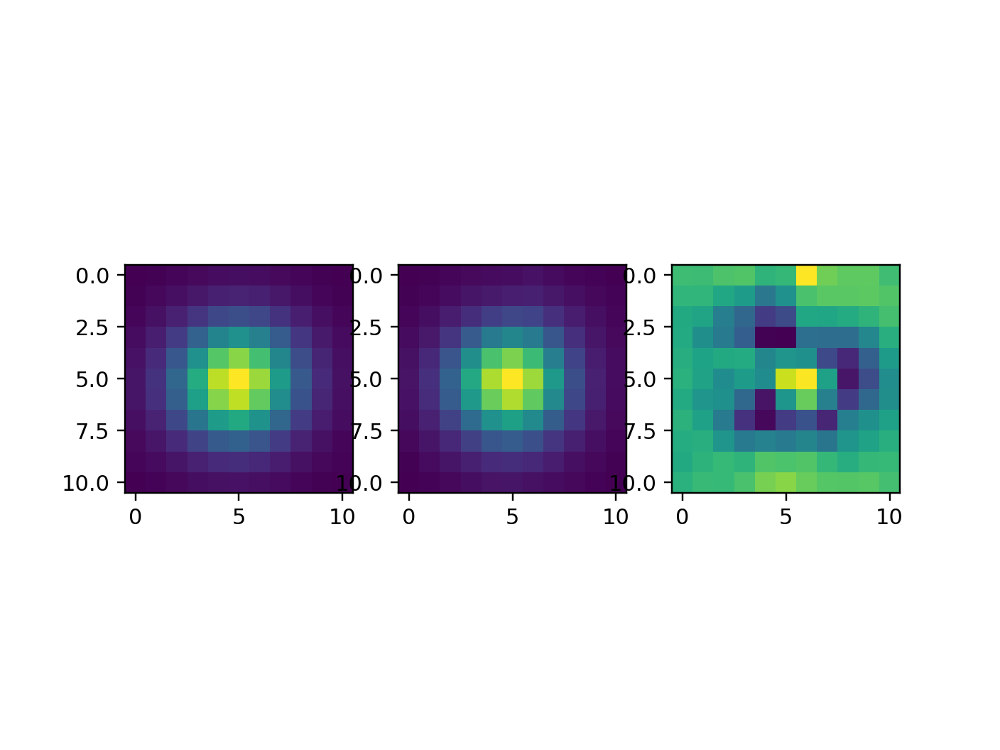

In [905]:
plt.figure()
plt.subplot(131)
plt.imshow(psf)
plt.subplot(132)
plt.imshow(cut/np.nansum(cut))
plt.subplot(133)
plt.imshow(cut/np.nansum(cut)-psf)

<IPython.core.display.Javascript object>


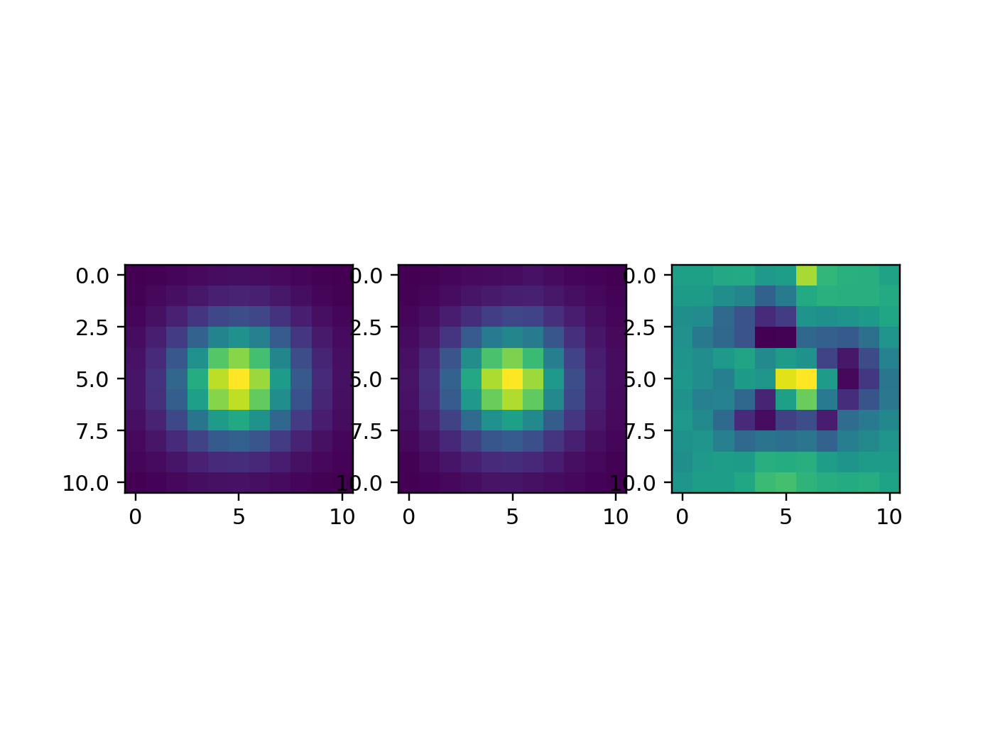

In [916]:
cut = deepcopy(flux[yint-s:yint+s+1,xint-s:xint+s+1])
plt.figure()
plt.subplot(131)
plt.imshow(psf*cflux)
plt.subplot(132)
plt.imshow(cut)
plt.subplot(133)
plt.imshow(cut-psf*f.x)

<IPython.core.display.Javascript object>


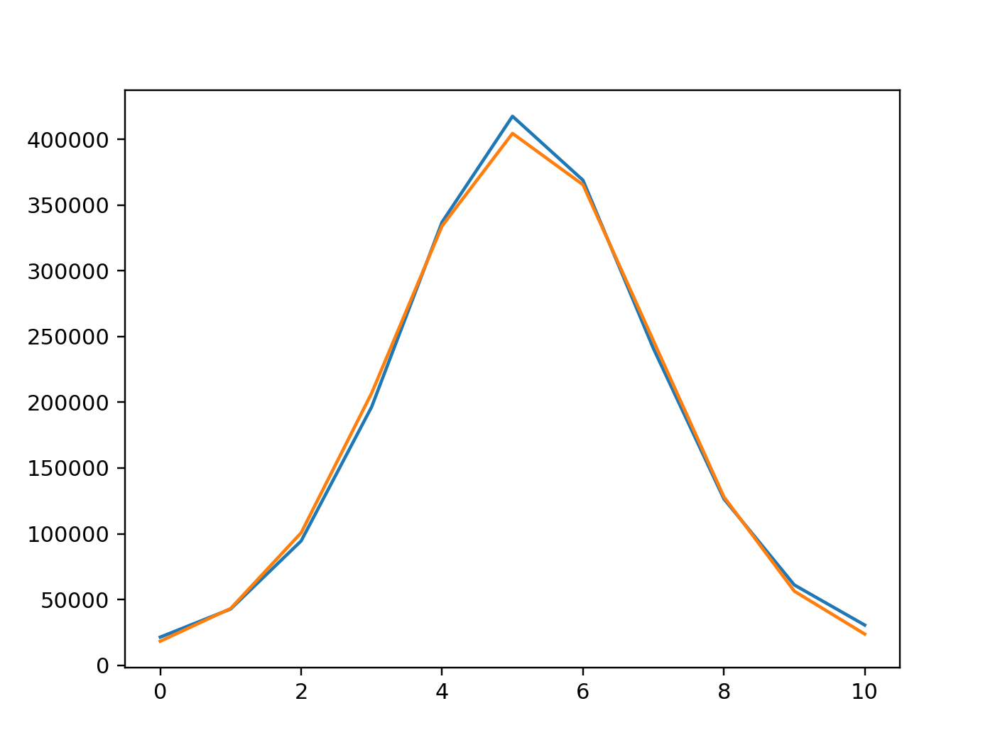

In [907]:
plt.figure()
plt.plot((cut)[:,5])
plt.plot(psf[:,5]*f.x)

In [812]:
def log_likelihood(theta,data,x,y):
    xs = x + theta[-2]
    ys = y + theta[-1]
    model = PS_PSF(theta[:-2],x,y)
    return -0.5 * np.sum((data - model) ** 2)

def log_prior(theta):
    #if theta[0] >= 0 and theta[1] >= 0 and theta[2] >= 0 and theta[3] >= 0 and theta[4] >= 0:
    if theta[0] > 0 and theta[1] > 0 and theta[0] < 10 and theta[1] < 10 and theta[3] < 10 and theta[4] < 10:
        return 0.0
    return -np.inf

def log_probability(theta,data,x,y):
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(theta, data,x,y)

In [766]:
res.x

array([2.77717108, 2.69716359, 0.0066561 , 2.05959813, 0.04138541,
       0.25228327])

In [768]:
ncut = cut / np.nansum(cut)
import emcee
x0 = res.x
pos = x0 + 0.1 * np.random.randn(32, 6)
nwalkers, ndim = pos.shape

sampler = emcee.EnsembleSampler(
	nwalkers, ndim, log_probability, args=(ncut,x,y)
	)
sampler.run_mcmc(pos, 5000, progress=True);

100%|██████████████████████████████████████████████████████████████████| 5000/5000 [00:03<00:00, 1611.19it/s]


<IPython.core.display.Javascript object>


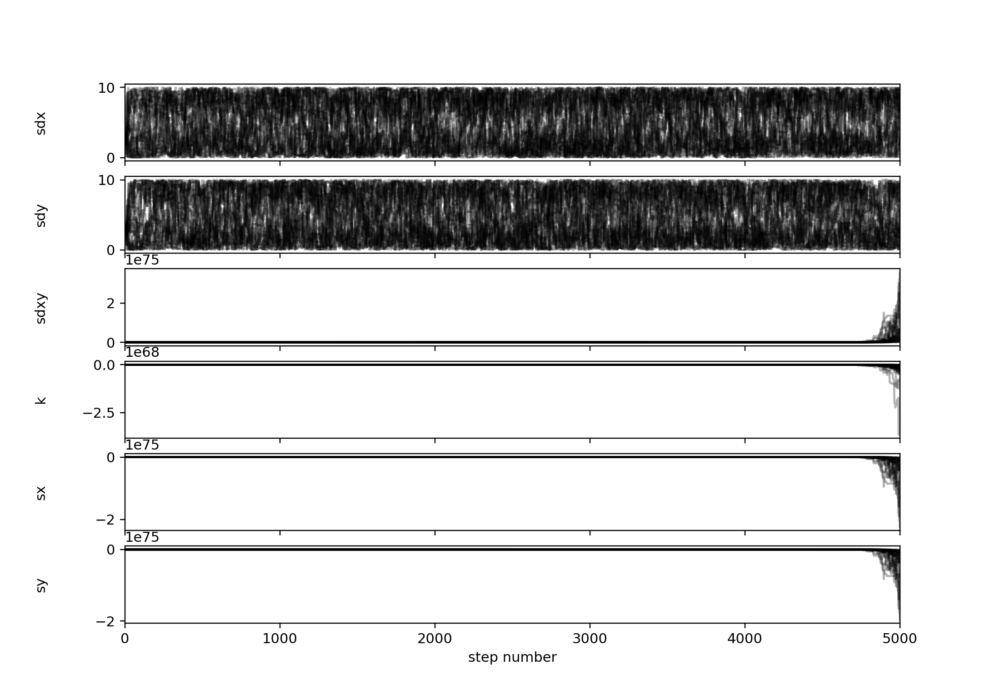

In [769]:
fig, axes = plt.subplots(6, figsize=(10, 7), sharex=True)
samples = sampler.get_chain()
labels = ['sdx','sdy','sdxy','k','sx','sy']
for i in range(ndim):
	ax = axes[i]
	ax.plot(samples[:, :, i], "k", alpha=0.3)
	ax.set_xlim(0, len(samples))
	ax.set_ylabel(labels[i])
	ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

In [437]:
from photutils.psf import FittableImageModel

fitter = fitting.LevMarLSQFitter()
model2d = FittableImageModel(cut)
result = fitter(model2d, x-50, y-50, cut)

<IPython.core.display.Javascript object>


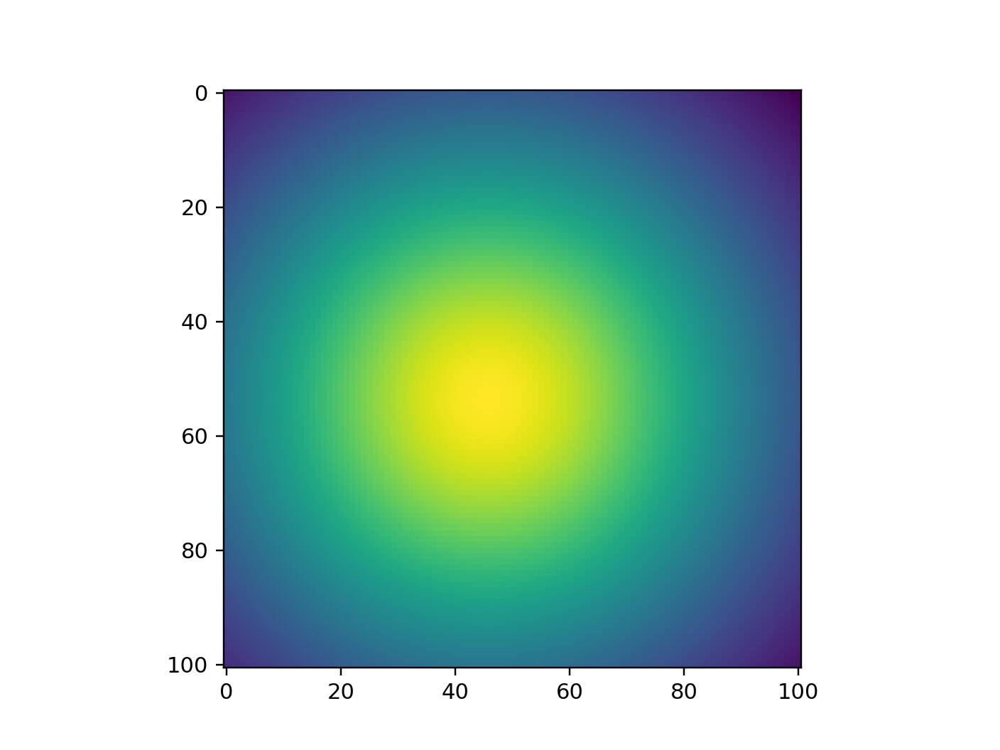

In [187]:
10**((thingo.rMeanPSFMag-(25+2.5*np.log10(hdu[0].header['EXPTIME'])))/-2.5)

68531.40358166046

In [371]:
thingo = tab.iloc[30]

In [372]:
thingo.rMeanPSFMag + 2.5*np.log10(np.sum(fitted_mof(x-50,y-50))) - 2.5*np.log10(hdu[0].header['EXPTIME'])

24.808555149420016

In [190]:
2.5*np.log10(hdu[0].header['EXPTIME'])

7.768024924119671

In [387]:
xx = sat['x'].values[0]; yy = sat['y'].values[0]
satcut = flux[int(yy)-50:int(yy)+51,int(xx)-50:int(xx)+51]
mod = fitted_mof(x-50,y-50)
zp = 25 + 2.5*np.log10(hdu[0].header['EXPTIME'])
inject = mod /np.sum(mod) * 10**((sat.rMeanPSFMag.values[0] - zp)/-2.5)

In [388]:
from copy import deepcopy

In [389]:
indo = np.where(np.isnan(satcut))
test = deepcopy(satcut)
test[indo] = inject[indo]

<IPython.core.display.Javascript object>


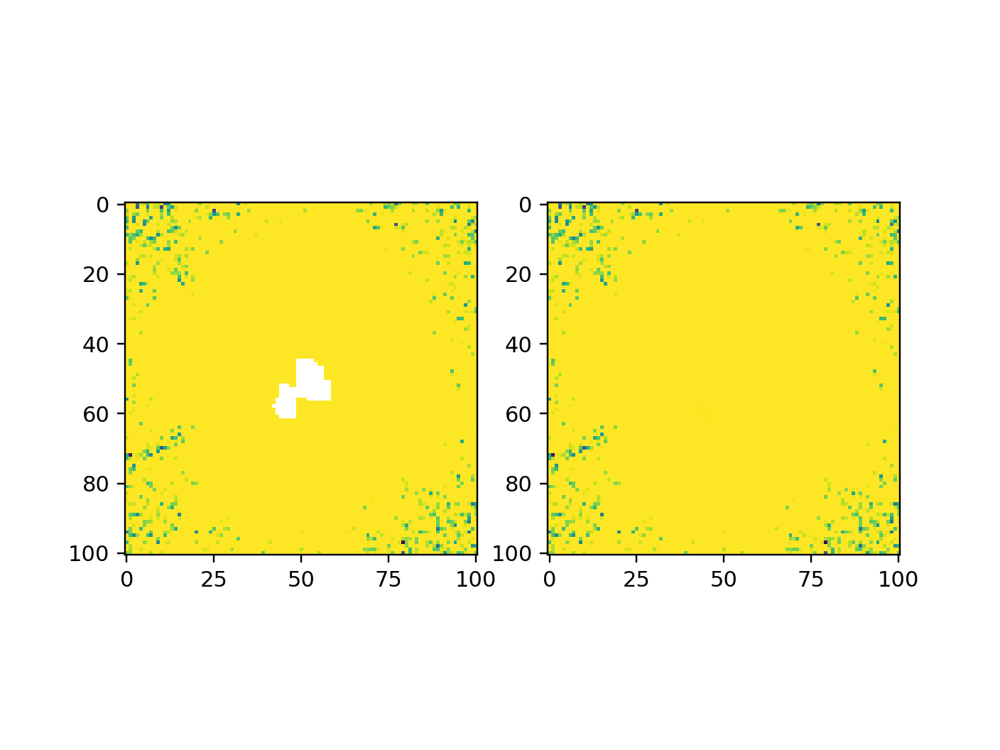

In [390]:
plt.figure()
plt.subplot(121)
plt.imshow(satcut,vmax=5)
plt.subplot(122)
plt.imshow(test,vmax=5)

<IPython.core.display.Javascript object>


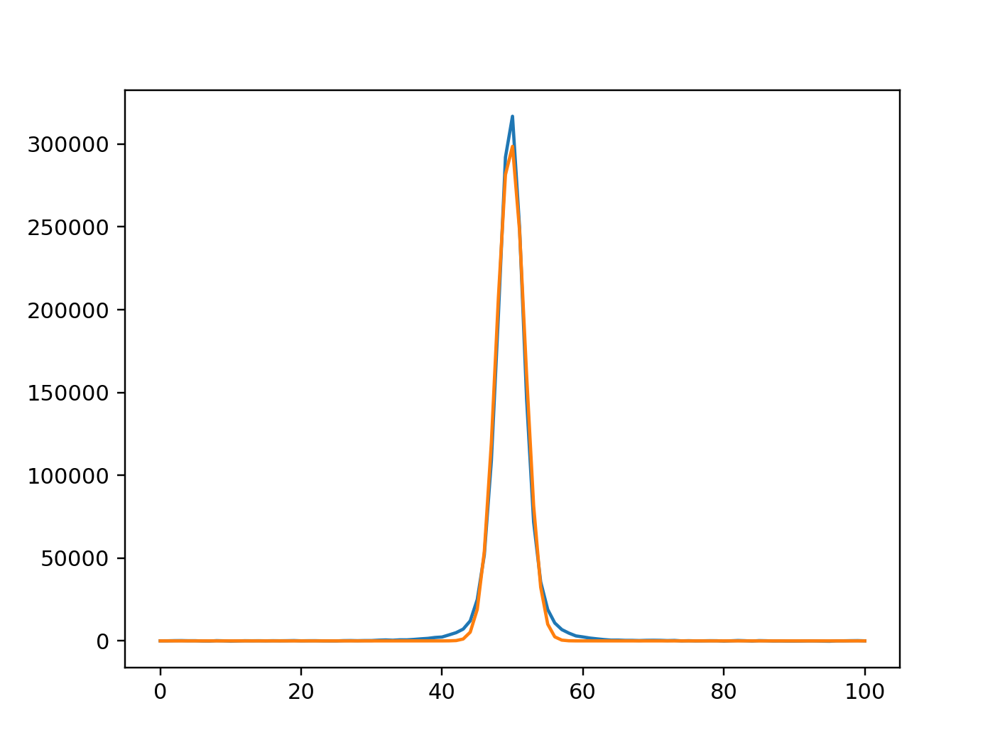

In [391]:
plt.figure()
plt.plot(cut[:,50])
plt.plot(fitted_mof(x-50,y-50)[:,50])

In [196]:
np.sum(fitted_mof(x-50,y-50))

4625.043726621901

<IPython.core.display.Javascript object>


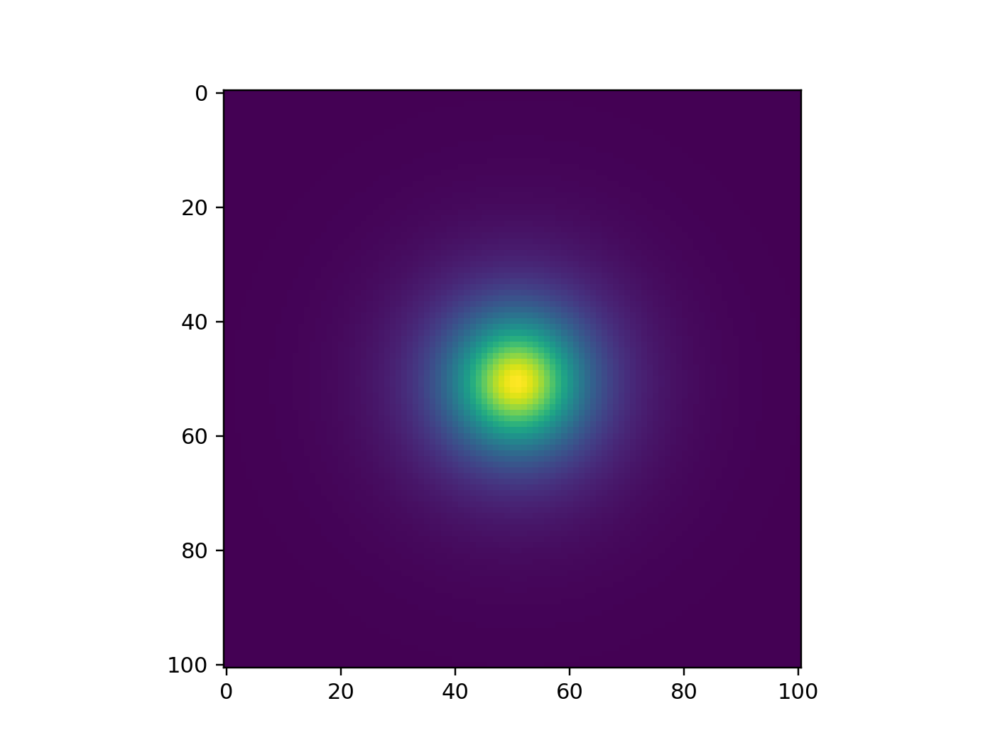

In [197]:
plt.figure()
plt.imshow(fitted_mof(x-50,y-50))

In [85]:
from starkiller import create_psf

In [86]:
create_psf()

starkiller.trail_psf.create_psf

In [84]:
sat.rMeanPSFMag

235     11.6920
1104    10.9258
1193     9.7910
2723    11.6110
3595    13.0740
3907    12.0340
4558    10.3950
4734    13.0340
5220    11.8360
7031    11.5710
7033    12.6870
7426    12.0150
7632    10.1856
7633    10.1660
7634    14.0318
8275    11.9440
8726    10.9670
Name: rMeanPSFMag, dtype: float64

In [72]:
10**((tab.iloc[ind].rMeanPSFMag.values-(25+2.5*np.log10(hdu[0].header['EXPTIME'])))/-2.5)
10**((tab.iloc[ind].rMeanPSFMag.values-25)/-2.5)

array([ 210474.67343703,  426265.19216383, 1212271.38364609,
        226777.50640832,   58938.60555865,  153603.05071187,
        695024.02455554,   61150.47590729,  184331.61282399,
        235288.09870022,   84178.24947154,  156314.71483551,
        842868.62454493,  858222.41558178,   24393.82433052,
        166878.31361197,  410393.04957721])

In [ ]:
a2=self.alpha*self.alpha
mof = (beta-1)/(np.pi*a2)*(1.+(rad/self.alpha)**2)**(-self.beta)

In [64]:
tab.iloc[ind].rMeanPSFMag.values

235     11.6920
1104    10.9258
1193     9.7910
2723    11.6110
3595    13.0740
3907    12.0340
4558    10.3950
4734    13.0340
5220    11.8360
7031    11.5710
7033    12.6870
7426    12.0150
7632    10.1856
7633    10.1660
7634    14.0318
8275    11.9440
8726    10.9670
Name: rMeanPSFMag, dtype: float64

In [164]:
2.5*np.log10(40)

4.005149978319905

In [66]:
hdu[0].header

SIMPLE  =                    T / Uncompressed file's conforms to FITS           
BITPIX  =                  -32 / data type of original image                    
NAXIS   =                    2 / dimension of original image                    
NAXIS1  =                 6307 / length of original image axis                  
NAXIS2  =                 6289 / length of original image axis                  
CTYPE1  = 'RA---TAN'                                                            
CTYPE2  = 'DEC--TAN'                                                            
CRVAL1  =     123.749999999996                                                  
CRVAL2  =     45.9999999999984                                                  
CRPIX1  =              -11416.                                                  
CRPIX2  =               17669.                                                  
CDELT1  = 6.94444461259988E-05                                                  
CDELT2  = 6.94444461259988E-

In [915]:
fits.open('data/ps1_skycell/ps1grid.fits')[1].data

FITS_rec([(13,  487, 72, -38., -3.99856992e+01, -3.59874887e+01, 6305, 6279, 239.5, 238. ),
          (14,  559, 76, -34., -3.59874887e+01, -3.19889478e+01, 6265, 6274, 237.5, 237.5),
          (15,  635, 79, -30., -3.19889478e+01, -2.79905858e+01, 6274, 6269, 239.5, 241.5),
          (16,  714, 82, -26., -2.79905858e+01, -2.39918563e+01, 6255, 6265, 241.5, 240.5),
          (17,  796, 84, -22., -2.39918563e+01, -1.99933311e+01, 6279, 6261, 241. , 242. ),
          (18,  880, 86, -18., -1.99933311e+01, -1.59944641e+01, 6274, 6258, 241.5, 238. ),
          (19,  966, 88, -14., -1.59944641e+01, -1.19956715e+01, 6242, 6254, 240.5, 239.5),
          (20, 1054, 89, -10., -1.19956715e+01, -7.99701482e+00, 6248, 6250, 240. , 242. ),
          (21, 1143, 89,  -6., -7.99701482e+00, -3.99808693e+00, 6291, 6247, 237.5, 240. ),
          (22, 1232, 90,  -2., -3.99808693e+00,  1.38777878e-17, 6240, 6243, 240. , 242. ),
          (23, 1322, 90,   2.,  1.38777878e-17,  3.99808693e+00, 6240, 6243, 240